# Advanced Medical Image Classification: A Multi-Model Pipeline with Input Validation

**Project Goal:** Evolve a single-model notebook into a comprehensive, comparative deep learning framework for classifying medical images. This pipeline will train and evaluate multiple architectures, select and tune the best-performing model, and integrate a "Gatekeeper" system to validate inputs, creating a robust, production-ready solution.

## Part 1: Project Foundation

### 1. Setup & Configuration

This section establishes the foundation of our project. We import all necessary libraries, including `optuna` for hyperparameter tuning, and define a master `Config` class to control all paths, parameters, and models centrally.

#### 1.1. Library Imports

In [1]:
# === Core Python & Data Science Libraries ===
import os
import gc
import copy
import random
import shutil
import hashlib
from pathlib import Path
from io import BytesIO
import numpy as np
import pandas as pd
from PIL import Image, UnidentifiedImageError
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
import warnings

# === Deep Learning: PyTorch ===
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset
from torchvision import models, transforms, datasets
from torch.nn import functional as F
import cv2 # For Grad-CAM

# === Scikit-learn for ML & Metrics ===
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    f1_score,
    precision_score,
    recall_score
)

# === Hyperparameter Tuning ===
import optuna

# Reduce verbosity for cleaner output
warnings.filterwarnings("ignore")
tqdm.pandas()

#### 1.2. Project Configuration

In [2]:
class Config:
    # --- Input Diagnostic Dataset Paths ---
    KIDNEY_ROOT_DIR = Path("/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/")
    KIDNEY_CSV_PATH = Path("/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/kidneyData.csv")
    COLON_ROOT_DIR = Path("/kaggle/input/coloncancerct-2025-abdominal-ct-scans/ColonCancerCT-2025 A Dataset of Abdominal CT Scans/Split_Data/Split_Data/")
    LIVER_ROOT_DIR = Path("/kaggle/input/liver-ct-image-dataset/Liver_CT_Image_Dataset/")
    
    # --- Gatekeeper Negative Dataset Paths ---
    CHEST_XRAY_DIR = Path("/kaggle/input/chest-xray-pneumonia/chest_xray/")
    INTEL_IMAGE_DIR = Path("/kaggle/input/intel-image-classification/")
    CIFAR10_DOWNLOAD_DIR = Path("/kaggle/working/cifar10_raw/") # For downloading
    
    # --- Working Directories ---
    WORKING_DIR = Path("/kaggle/working/")
    # Diagnostic Model Dirs
    SPLIT_DATA_DIR = WORKING_DIR / "multi_organ_data_split"
    MODEL_WEIGHTS_DIR = WORKING_DIR / "model_weights"
    # Gatekeeper Model Dirs
    GATEKEEPER_RAW_DIR = WORKING_DIR / "gatekeeper_raw_data"
    GATEKEEPER_SPLIT_DIR = WORKING_DIR / "gatekeeper_split_data"

    # --- Model & Training Hyperparameters ---
    MODELS_TO_TRAIN = ["EfficientNet-B0", "ResNet50", "MobileNet_V3_Large", "DenseNet121", "VGG16"]
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    BATCH_SIZE = 32
    IMG_SIZE = 224
    LEARNING_RATE = 1e-4
    OPTIMIZER_NAME = "AdamW"
    EPOCHS = 15
    PATIENCE = 3 # For early stopping
    RANDOM_STATE = 42
    NUM_WORKERS = 0

# Create all necessary directories
for dir_path in [Config.SPLIT_DATA_DIR, Config.MODEL_WEIGHTS_DIR, Config.GATEKEEPER_RAW_DIR, Config.GATEKEEPER_SPLIT_DIR, Config.CIFAR10_DOWNLOAD_DIR]:
    dir_path.mkdir(parents=True, exist_ok=True)

plt.style.use("seaborn-v0_8-whitegrid")

#### 1.3. Seeding for Reproducibility

In [3]:
def seed_everything(seed):
    """Set seeds for all relevant libraries to ensure reproducible results."""
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

seed_everything(Config.RANDOM_STATE)

print(f"Using device: {Config.DEVICE}")
print(f"Seed set to {Config.RANDOM_STATE} for reproducibility.")

Using device: cuda
Seed set to 42 for reproducibility.


### 2. Data Loading & Aggregation

We use modular functions to load data from three different CT scan datasets. This data is aggregated into a single `master_df` and subjected to an initial Exploratory Data Analysis (EDA) to understand its composition.

#### 2.1. Dataset Loading Functions

In [4]:
def load_kidney_data(root_dir, csv_path):
    """Loads kidney dataset metadata from its CSV and creates full image paths."""
    print(f"Loading Kidney data from: {root_dir}")
    df = pd.read_csv(csv_path)
    df['Class'] = 'Kidney_' + df['Class']
    df['full_path'] = df.apply(lambda row: root_dir / row['Class'].replace('Kidney_', '') / f"{row['image_id']}.jpg", axis=1)
    print(f"Found {len(df)} kidney image records.")
    return df[['full_path', 'Class']]

def load_colon_data(root_dir):
    """Loads colon cancer dataset by scanning class folders."""
    print(f"Loading Colon data from: {root_dir}")
    records = []
    for path in tqdm(list(root_dir.rglob('*.png')), desc="Scanning colon images"):
        class_name_raw = path.parent.name
        class_name = 'Colon_Cancer' if class_name_raw == 'cancer' else 'Colon_Non_Cancer'
        records.append({'full_path': path, 'Class': class_name})
    df = pd.DataFrame(records)
    print(f"Found {len(df)} colon image records.")
    return df

def load_liver_data(root_dir):
    """Loads liver dataset from its class-based folder structure."""
    print(f"Loading Liver data from: {root_dir}")
    records = []
    class_map = {'Healthy': 'Liver_Healthy', 'Hepatic_Steatosis': 'Liver_Hepatic_Steatosis'}
    for folder_name, class_name in class_map.items():
        for path in (root_dir / folder_name).glob('*'):
            if path.suffix.lower() in ['.jpg', '.jpeg', '.png']:
                records.append({'full_path': path, 'Class': class_name})
    df = pd.DataFrame(records)
    print(f"Found {len(df)} liver image records.")
    return df

#### 2.2. Data Aggregation and Initial EDA

In [5]:
# --- Load all datasets and aggregate ---
kidney_df = load_kidney_data(Config.KIDNEY_ROOT_DIR, Config.KIDNEY_CSV_PATH)
colon_df = load_colon_data(Config.COLON_ROOT_DIR)
liver_df = load_liver_data(Config.LIVER_ROOT_DIR)

master_df = pd.concat([kidney_df, colon_df, liver_df], ignore_index=True)

print("\n--- Initial Master DataFrame ---")
print(f"Total records before cleaning: {len(master_df)}")
display(master_df.head())

Loading Kidney data from: /kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone
Found 12446 kidney image records.
Loading Colon data from: /kaggle/input/coloncancerct-2025-abdominal-ct-scans/ColonCancerCT-2025 A Dataset of Abdominal CT Scans/Split_Data/Split_Data


Scanning colon images:   0%|          | 0/11340 [00:00<?, ?it/s]

Found 11340 colon image records.
Loading Liver data from: /kaggle/input/liver-ct-image-dataset/Liver_CT_Image_Dataset
Found 3557 liver image records.

--- Initial Master DataFrame ---
Total records before cleaning: 27343


,full_path,Class
0,/kaggle/input/ct-kidney-dataset-normal-cyst-tu...,Kidney_Tumor
1,/kaggle/input/ct-kidney-dataset-normal-cyst-tu...,Kidney_Tumor
2,/kaggle/input/ct-kidney-dataset-normal-cyst-tu...,Kidney_Tumor
3,/kaggle/input/ct-kidney-dataset-normal-cyst-tu...,Kidney_Tumor
4,/kaggle/input/ct-kidney-dataset-normal-cyst-tu...,Kidney_Tumor


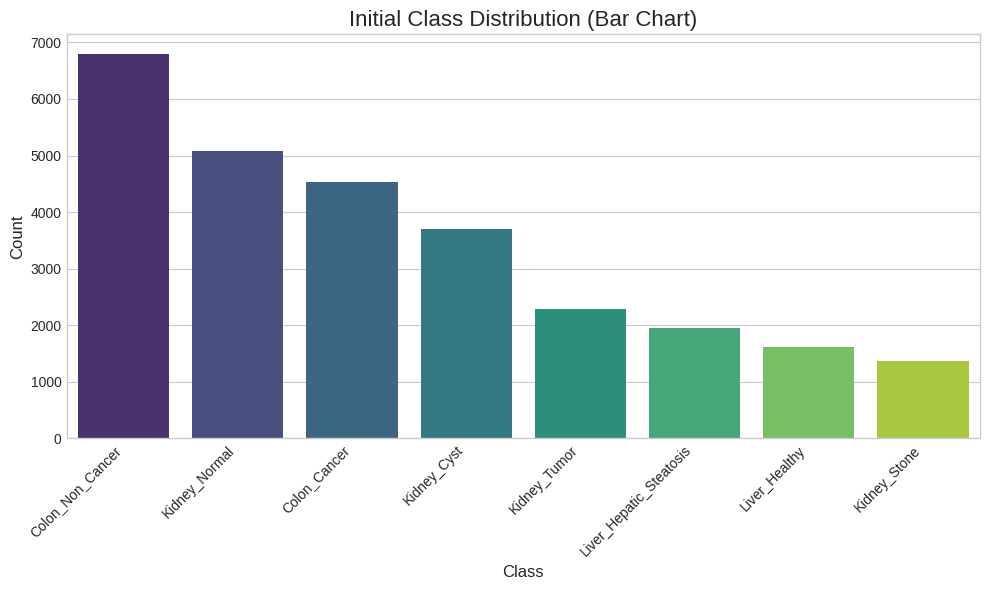

In [6]:
class_counts = master_df['Class'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
plt.title('Initial Class Distribution (Bar Chart)', fontsize=16)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

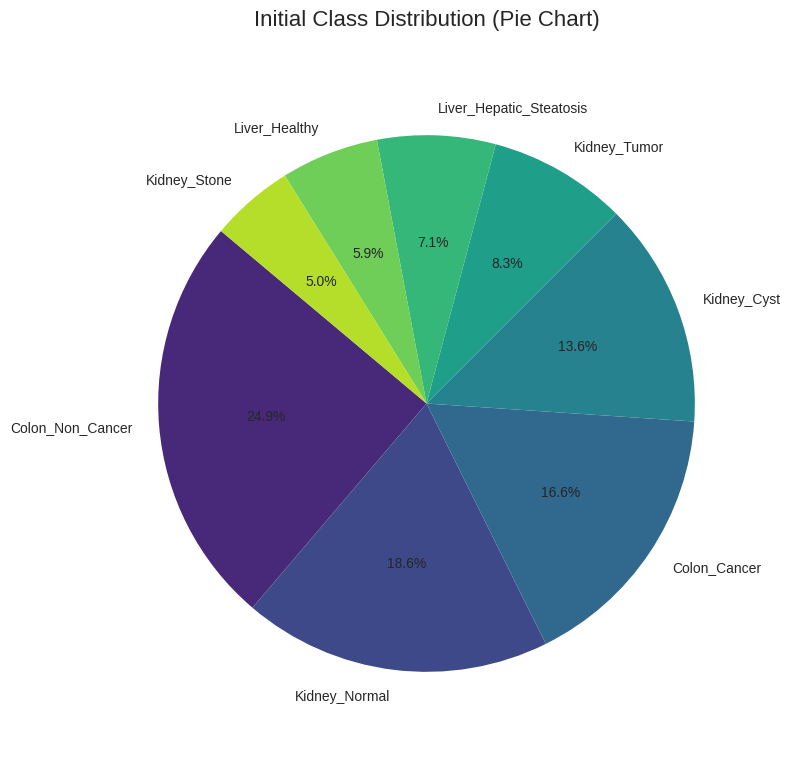

In [7]:
# --- Pie Chart of Class Proportions ---
plt.figure(figsize=(8, 8))
plt.pie(
    class_counts,
    labels=class_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("viridis", len(class_counts))
)
plt.title('Initial Class Distribution (Pie Chart)', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures pie is drawn as a circle.
plt.tight_layout()
plt.show()

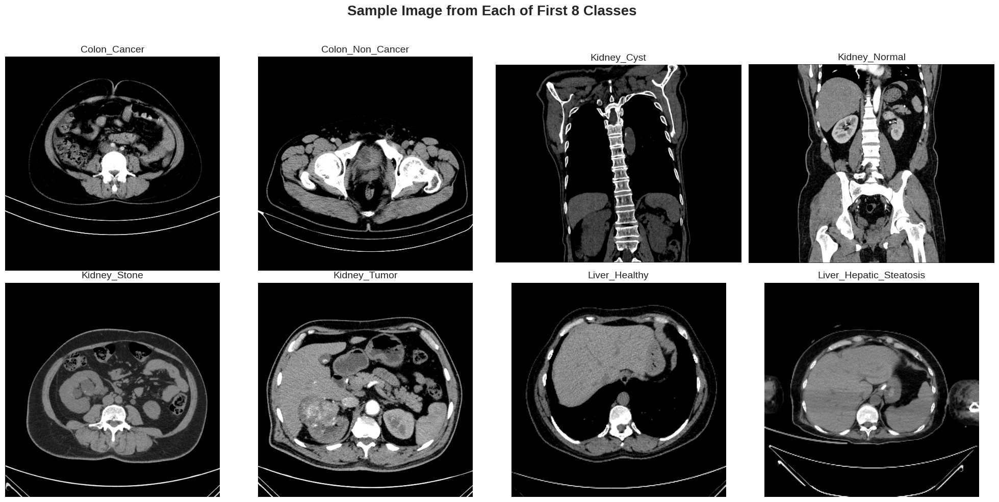

In [8]:
def default_loader(path):
    return Image.open(path).convert('RGB')

# Show only the first 8 unique classes
sample_classes = sorted(master_df['Class'].unique())[:8]

cols = 4
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
axes = axes.flatten()
fig.suptitle('Sample Image from Each of First 8 Classes', fontsize=20, weight='bold')

for i, class_name in enumerate(sample_classes):
    ax = axes[i]
    sample_path = master_df[master_df['Class'] == class_name] \
        .sample(1, random_state=Config.RANDOM_STATE)['full_path'].iloc[0]
    ax.imshow(default_loader(sample_path))
    ax.set_title(class_name, fontsize=14)
    ax.axis('off')

# Hide unused subplots if any (shouldn’t be needed here, but kept for generality)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### 3. Data Preprocessing

We ensure data quality by verifying every image and removing duplicates. We then define standard data augmentation pipelines to create robust models.

#### 3.1. Data Cleaning

In [9]:
def get_clean_dataframe(df: pd.DataFrame) -> pd.DataFrame:
    """Cleans the dataframe by verifying image integrity and removing duplicates."""
    print("\nStarting data cleaning process...")
    df_copy = df.copy()
    df_copy['full_path'] = df_copy['full_path'].apply(lambda p: Path(p))
    
    initial_count = len(df_copy)

    # 1. Verify image integrity
    tqdm.pandas(desc="Verifying images")
    def is_valid_image(path):
        try:
            with Image.open(path) as img:
                 img.verify()
            return True
        except Exception:
            return False
    
    valid_mask = df_copy['full_path'].progress_apply(is_valid_image)
    df_copy = df_copy[valid_mask].reset_index(drop=True)
    num_invalid = initial_count - len(df_copy)
    if num_invalid > 0:
        print(f"Removed {num_invalid} corrupted or unreadable image entries.")

    # 2. Remove duplicates using MD5 hashing
    tqdm.pandas(desc="Calculating MD5 hashes")
    df_copy["md5_hash"] = df_copy["full_path"].progress_apply(lambda p: hashlib.md5(p.read_bytes()).hexdigest())

    num_before_dedupe = len(df_copy)
    df_clean = df_copy.drop_duplicates(subset=["md5_hash"], keep="first")
    num_duplicates = num_before_dedupe - len(df_clean)
    if num_duplicates > 0:
        print(f"Removed {num_duplicates} duplicate images based on MD5 hash.")

    df_clean = df_clean.drop(columns=['md5_hash']).reset_index(drop=True)
    print(f"Total files removed: {num_invalid + num_duplicates}")
    print(f"Data cleaning complete. Final clean images: {len(df_clean)}")
    return df_clean

clean_master_df = get_clean_dataframe(master_df)


Starting data cleaning process...


Verifying images:   0%|          | 0/27343 [00:00<?, ?it/s]

Calculating MD5 hashes:   0%|          | 0/27343 [00:00<?, ?it/s]

Removed 1124 duplicate images based on MD5 hash.
Total files removed: 1124
Data cleaning complete. Final clean images: 26219


#### 3.2. Image Augmentation

In [10]:
# Define ImageNet mean and standard deviation for normalization
mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((Config.IMG_SIZE, Config.IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

val_test_transform = transforms.Compose([
    transforms.Resize((Config.IMG_SIZE, Config.IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

print("Image transformation pipelines defined.")

Image transformation pipelines defined.


### 4. Data Splitting & Organization

The cleaned dataset is split into train, validation, and test sets. We use stratification to maintain class proportions in each split. The files are then physically organized into a new directory structure compatible with PyTorch's `ImageFolder` for efficient loading.

#### 4.1. Stratified Splitting

In [11]:
df = clean_master_df.copy()
class_names = sorted(df["Class"].unique().tolist())
class_to_idx = {name: i for i, name in enumerate(class_names)}
idx_to_class = {i: name for name, i in class_to_idx.items()}
df["label"] = df["Class"].map(class_to_idx)
num_classes = len(class_names)
print(f"Total unique classes for diagnostic task: {num_classes}")

# Stratified Split (70% train, 15% validation, 15% test)
train_df, temp_df = train_test_split(
    df, test_size=0.30, stratify=df["label"], random_state=Config.RANDOM_STATE
)
validation_df, test_df = train_test_split(
    temp_df, test_size=0.50, stratify=temp_df["label"], random_state=Config.RANDOM_STATE
)

print("--- Data Split Summary ---")
print(f"Training set size:   {len(train_df)} images")
print(f"Validation set size: {len(validation_df)} images")
print(f"Test set size:       {len(test_df)} images")

Total unique classes for diagnostic task: 8
--- Data Split Summary ---
Training set size:   18353 images
Validation set size: 3933 images
Test set size:       3933 images


#### 4.2. File System Organization

In [12]:
def organize_files_for_imagefolder(df_split, split_name: str, base_dir: Path):
    """Copies files into a structured directory for ImageFolder."""
    split_dir = base_dir / split_name
    print(f"\nOrganizing {split_name} files in: {split_dir}")
    for _, row in tqdm(df_split.iterrows(), total=len(df_split), desc=f"Copying {split_name} files"):
        destination_dir = split_dir / row["Class"]
        destination_dir.mkdir(parents=True, exist_ok=True)
        shutil.copy(row["full_path"], destination_dir / row["full_path"].name)

# Clean and organize files for the diagnostic model
if Config.SPLIT_DATA_DIR.exists():
    shutil.rmtree(Config.SPLIT_DATA_DIR)
Config.SPLIT_DATA_DIR.mkdir()

organize_files_for_imagefolder(train_df, "train", Config.SPLIT_DATA_DIR)
organize_files_for_imagefolder(validation_df, "validation", Config.SPLIT_DATA_DIR)
organize_files_for_imagefolder(test_df, "test", Config.SPLIT_DATA_DIR)


Organizing train files in: /kaggle/working/multi_organ_data_split/train


Copying train files:   0%|          | 0/18353 [00:00<?, ?it/s]


Organizing validation files in: /kaggle/working/multi_organ_data_split/validation


Copying validation files:   0%|          | 0/3933 [00:00<?, ?it/s]


Organizing test files in: /kaggle/working/multi_organ_data_split/test


Copying test files:   0%|          | 0/3933 [00:00<?, ?it/s]

#### 4.3. Verify Split Distribution

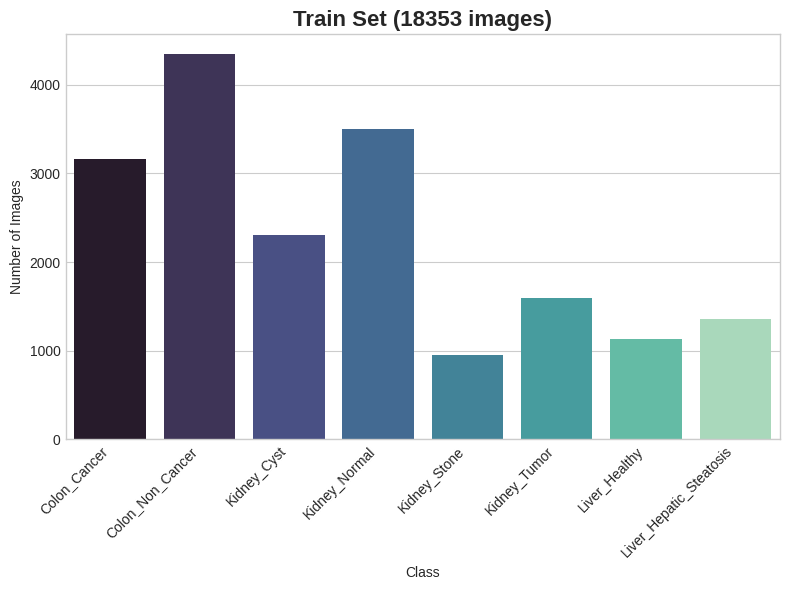

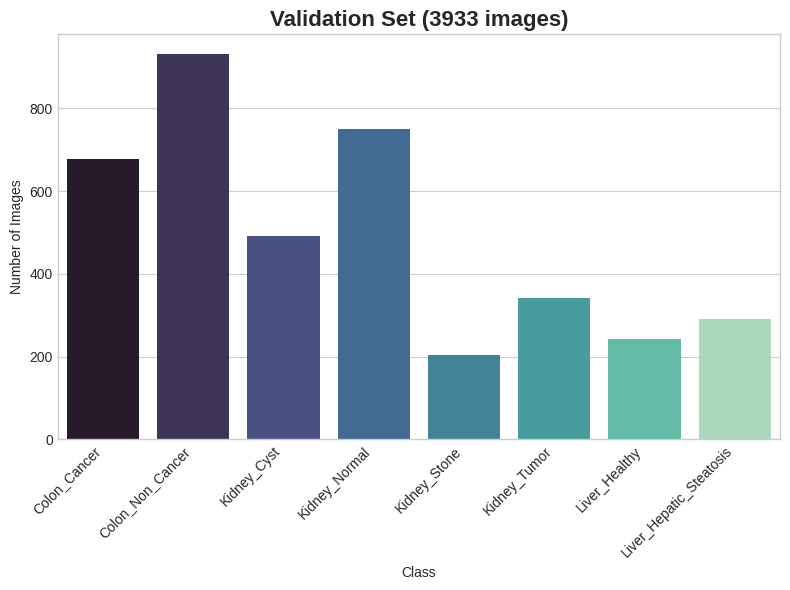

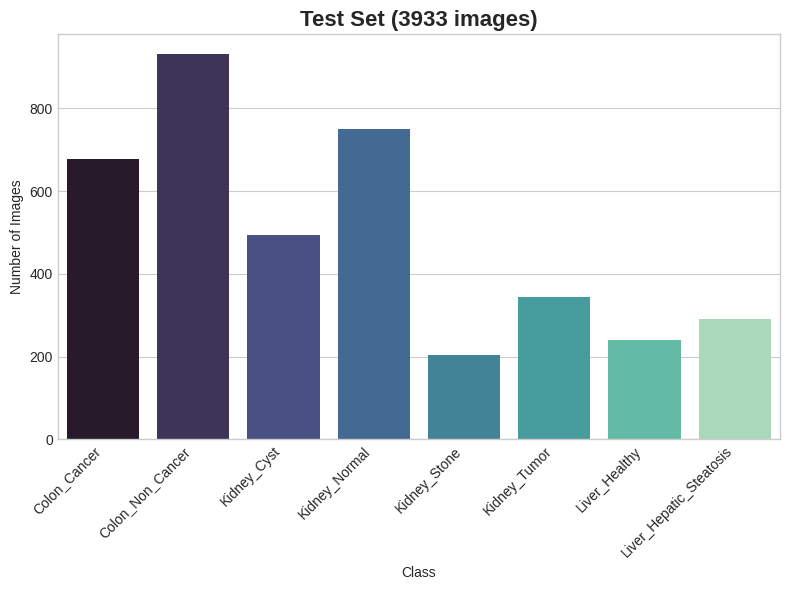

In [13]:
def plot_split_distributions(train_df, val_df, test_df):
    splits = {
        'Train': train_df,
        'Validation': val_df,
        'Test': test_df
    }

    for name, df in splits.items():
        plt.figure(figsize=(8, 6))
        class_counts = df['Class'].value_counts().sort_index()
        sns.barplot(x=class_counts.index, y=class_counts.values, palette='mako')

        plt.title(f'{name} Set ({len(df)} images)', fontsize=16, weight='bold')
        plt.xlabel('Class')
        plt.ylabel('Number of Images')
        plt.xticks(rotation=45, ha='right')  # ha (horizontal alignment) works here, not in tick_params()
        plt.tight_layout()
        plt.show()

# Call the function
plot_split_distributions(train_df, validation_df, test_df)

#### 4.4. Package Test Set for Download

In [14]:
print("Packaging the test set for download...")
archive_path = Config.WORKING_DIR / 'diagnostic_test_set'
test_set_dir = Config.SPLIT_DATA_DIR / 'test'
shutil.make_archive(str(archive_path), 'zip', test_set_dir)
print(f"Test set successfully zipped to {archive_path}.zip")

Packaging the test set for download...
Test set successfully zipped to /kaggle/working/diagnostic_test_set.zip


#### 4.5. Create DataLoaders

In [15]:
train_dataset = datasets.ImageFolder(root=Config.SPLIT_DATA_DIR / "train", transform=train_transform)
validation_dataset = datasets.ImageFolder(root=Config.SPLIT_DATA_DIR / "validation", transform=val_test_transform)
test_dataset = datasets.ImageFolder(root=Config.SPLIT_DATA_DIR / "test", transform=val_test_transform)

train_loader = DataLoader(
    train_dataset, batch_size=Config.BATCH_SIZE, shuffle=True,
    num_workers=Config.NUM_WORKERS, pin_memory=True
)
validation_loader = DataLoader(
    validation_dataset, batch_size=Config.BATCH_SIZE, shuffle=False,
    num_workers=Config.NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=Config.BATCH_SIZE, shuffle=False,
    num_workers=Config.NUM_WORKERS, pin_memory=True
)

print("--- DataLoaders Summary ---")
print(f"DataLoaders created with batch size {Config.BATCH_SIZE}.")
print(f"  - Train batches:      {len(train_loader)}")
print(f"  - Validation batches: {len(validation_loader)}")
print(f"  - Test batches:       {len(test_loader)}")

--- DataLoaders Summary ---
DataLoaders created with batch size 32.
  - Train batches:      574
  - Validation batches: 123
  - Test batches:       123


## Part 2: Expanded Modeling Pipeline

### 5. Model & Training Infrastructure
This section builds the reusable components of our modeling pipeline, including a modular model loader, a weighted loss function for imbalance, and robust training/evaluation functions.

#### 5.1. Evaluation Metrics & Loss Function

**Key Evaluation Metrics**
- **Accuracy**: The proportion of total predictions that were correct. Best for balanced datasets.
  - `(TP + TN) / (TP + TN + FP + FN)`
- **Precision**: Of all the positive predictions made, how many were actually positive? Measures the cost of a false positive.
  - `TP / (TP + FP)`
- **Recall (Sensitivity)**: Of all the actual positive samples, how many did the model correctly identify? Measures the cost of a false negative.
  - `TP / (TP + FN)`
- **F1-Score**: The harmonic mean of Precision and Recall. It provides a single score that balances both concerns, making it excellent for imbalanced datasets.

In [16]:
# Calculate inverse frequency class weights from the training set
class_counts_train = np.bincount(train_dataset.targets)
weights = 1.0 / (torch.tensor(class_counts_train, dtype=torch.float) + 1e-6)
class_weights = (weights / weights.sum()).to(Config.DEVICE)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("--- Class Weights for Weighted Loss Function ---")
for i, name in enumerate(class_names):
    print(f"  - {name:<25}: {class_weights[i]:.6f}")

--- Class Weights for Weighted Loss Function ---
  - Colon_Cancer             : 0.069257
  - Colon_Non_Cancer         : 0.050386
  - Kidney_Cyst              : 0.095315
  - Kidney_Normal            : 0.062590
  - Kidney_Stone             : 0.230177
  - Kidney_Tumor             : 0.137127
  - Liver_Healthy            : 0.194263
  - Liver_Hepatic_Steatosis  : 0.160887


#### 5.2. Modular Model Loader

In [17]:
def get_model(model_name: str, num_classes: int, pretrained: bool = True):
    """Loads a specified pretrained model and adapts its classifier."""
    weights = "IMAGENET1K_V1" if pretrained else None
    model = None
    
    if model_name == "EfficientNet-B0":
        model = models.efficientnet_b0(weights=weights)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_name == "ResNet50":
        model = models.resnet50(weights=weights)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "MobileNet_V3_Large":
        model = models.mobilenet_v3_large(weights=weights)
        model.classifier[3] = nn.Linear(model.classifier[3].in_features, num_classes)
    elif model_name == "DenseNet121":
        model = models.densenet121(weights=weights)
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    elif model_name == "VGG16":
        model = models.vgg16(weights=weights)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    else:
        raise ValueError(f"Model '{model_name}' not supported.")
        
    return model.to(Config.DEVICE)

print(f"Modular model loader defined for: {Config.MODELS_TO_TRAIN}")

Modular model loader defined for: ['EfficientNet-B0', 'ResNet50', 'MobileNet_V3_Large', 'DenseNet121', 'VGG16']


#### 5.3. Training & Evaluation Functions

In [18]:
def train_model(model, train_loader, validation_loader, criterion, optimizer, epochs, save_path, patience):
    """
    Trains the model with early stopping and logs training/validation metrics.
    Returns the best model and history of metrics.
    """
    history = {
        'train_loss': [],
        'val_loss': [],
        'val_accuracy': [],
        'val_f1': [],
        'train_f1': []
    }
    
    best_val_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(epochs):
        # === Training Phase ===
        model.train()
        running_train_loss = 0.0
        train_true, train_pred = [], []
        
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item() * inputs.size(0)

            preds = torch.argmax(outputs, dim=1)
            train_pred.extend(preds.cpu().numpy())
            train_true.extend(labels.cpu().numpy())

        # === Validation Phase ===
        model.eval()
        running_val_loss = 0.0
        val_true, val_pred = [], []

        with torch.no_grad():
            for inputs, labels in validation_loader:
                inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
                outputs = model(inputs)

                running_val_loss += criterion(outputs, labels).item() * inputs.size(0)

                preds = torch.argmax(outputs, dim=1)
                val_pred.extend(preds.cpu().numpy())
                val_true.extend(labels.cpu().numpy())

        # === Epoch Metrics ===
        epoch_train_loss = running_train_loss / len(train_loader.dataset)
        epoch_val_loss = running_val_loss / len(validation_loader.dataset)
        epoch_val_acc = accuracy_score(val_true, val_pred)
        epoch_val_f1 = f1_score(val_true, val_pred, average='weighted')
        epoch_train_f1 = f1_score(train_true, train_pred, average='weighted')

        # === Logging ===
        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['val_accuracy'].append(epoch_val_acc)
        history['val_f1'].append(epoch_val_f1)
        history['train_f1'].append(epoch_train_f1)

        print(f"Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {epoch_train_loss:.4f} | "
              f"Val Loss: {epoch_val_loss:.4f} | "
              f"Val Acc: {epoch_val_acc:.4f} | "
              f"Val F1: {epoch_val_f1:.4f} | "
              f"Train F1: {epoch_train_f1:.4f}")

        # === Early Stopping ===
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), save_path)
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
                break

    print(f"\nTraining complete. Loading best model from {save_path}")
    model.load_state_dict(torch.load(save_path))
    return model, history

def evaluate_and_report(model, dataloader, class_names_list, set_name: str):
    """
    Evaluates the model and displays metrics + confusion matrix for a dataset.
    """
    model.eval()
    y_true, y_preds = [], []

    with torch.no_grad():
        for inputs, labels in tqdm(dataloader, desc=f"Evaluating on {set_name} set"):
            inputs = inputs.to(Config.DEVICE)
            preds = torch.argmax(model(inputs), dim=1)

            y_preds.extend(preds.cpu().numpy())
            y_true.extend(labels.numpy())

    print(f"\n--- Evaluation Results on {set_name} Set ---")
    report_str = classification_report(y_true, y_preds, target_names=class_names_list, digits=4)
    print(report_str)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_preds)
    plt.figure(figsize=(max(8, len(class_names_list)), max(6, len(class_names_list) * 0.8)))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names_list, yticklabels=class_names_list)
    plt.title(f'Confusion Matrix - {set_name} Set', fontsize=16)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.tight_layout()
    plt.show()

    # Metrics Summary
    metrics = {
        "Accuracy": accuracy_score(y_true, y_preds),
        "Precision (Weighted)": precision_score(y_true, y_preds, average='weighted', zero_division=0),
        "Recall (Weighted)": recall_score(y_true, y_preds, average='weighted', zero_division=0),
        "F1 Score (Weighted)": f1_score(y_true, y_preds, average='weighted', zero_division=0)
    }
    return metrics

### 6. Visualization Functions

For clarity, all helper functions for visualization are grouped here. This includes plotting learning curves, showing sample predictions, and generating Grad-CAM explainability heatmaps.

In [19]:
def plot_learning_curves(history, model_name):
    """Plots training vs. validation loss and F1-score."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
    fig.suptitle(f'Learning Curves for {model_name}', fontsize=18, weight='bold')

    epochs = range(1, len(history['train_loss']) + 1)

    # --- Loss Curves ---
    ax1.plot(epochs, history['train_loss'], 'b-o', label='Training Loss')
    ax1.plot(epochs, history['val_loss'], 'r-o', label='Validation Loss')
    ax1.set_title('Loss vs. Epochs')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    # --- F1-Score Curves ---
    ax2.plot(epochs, history['train_f1'], 'b-o', label='Training F1-Score')
    ax2.plot(epochs, history['val_f1'], 'g-o', label='Validation F1-Score')
    ax2.set_title('F1-Score vs. Epochs')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('F1-Score')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def visualize_predictions(model, dataloader, class_map, set_name):
    """Visualizes a mix of correct and incorrect predictions from a dataset."""
    model.eval()
    all_inputs, all_labels, all_preds = [], [], []
    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs.to(Config.DEVICE))
            preds = torch.argmax(outputs, dim=1)
            all_inputs.append(inputs.cpu())
            all_labels.append(labels.cpu())
            all_preds.append(preds.cpu())
            
    all_inputs = torch.cat(all_inputs)
    all_labels = torch.cat(all_labels)
    all_preds = torch.cat(all_preds)
    
    correct_indices = (all_labels == all_preds).nonzero(as_tuple=True)[0]
    incorrect_indices = (all_labels != all_preds).nonzero(as_tuple=True)[0]
    
    # Get up to 8 correct and 8 incorrect samples
    correct_samples = correct_indices[torch.randperm(len(correct_indices))[:8]]
    incorrect_samples = incorrect_indices[torch.randperm(len(incorrect_indices))[:8]]
    sample_indices = torch.cat([correct_samples, incorrect_samples])
    
    if len(sample_indices) == 0: 
        print("Could not find a mix of correct/incorrect samples to display.")
        return

    cols = 4
    rows = (len(sample_indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 5 * rows))
    fig.suptitle(f'Sample {set_name} Set Predictions', fontsize=20, weight='bold')
    axes = axes.flatten()
    
    for i, idx in enumerate(sample_indices):
        ax = axes[i]
        img = all_inputs[idx].permute(1, 2, 0).numpy()
        img = np.clip(img * std + mean, 0, 1)
        
        true_label = class_map[all_labels[idx].item()]
        pred_label = class_map[all_preds[idx].item()]
        color = 'green' if true_label == pred_label else 'red'
        
        ax.imshow(img)
        ax.set_title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=12)
        ax.axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()
    def hook_layers(self):
        def forward_hook(module, input, output): self.activations = output
        def backward_hook(module, grad_in, grad_out): self.gradients = grad_out[0]
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)
    def generate_heatmap(self, input_tensor, class_idx=None):
        self.model.eval()
        output = self.model(input_tensor)
        if class_idx is None: class_idx = output.argmax(dim=1).item()
        self.model.zero_grad()
        output[0, class_idx].backward()
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])
        for i in range(self.activations.shape[1]):
            self.activations[:, i, :, :] *= pooled_gradients[i]
        heatmap = torch.mean(self.activations, dim=1).squeeze()
        heatmap = F.relu(heatmap)
        heatmap /= torch.max(heatmap)
        return heatmap.detach().cpu().numpy()

def plot_grad_cam(model, target_layer, dataloader, class_map, n_images=4):
    grad_cam = GradCAM(model, target_layer)
    inputs, labels = next(iter(dataloader))
    fig, axes = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))
    fig.suptitle('Grad-CAM: What is the model looking at?', fontsize=18, weight='bold')
    for i in range(n_images):
        input_tensor = inputs[i].unsqueeze(0).to(Config.DEVICE)
        original_img_np = np.clip(inputs[i].permute(1, 2, 0).numpy() * std + mean, 0, 1)
        heatmap = grad_cam.generate_heatmap(input_tensor)
        heatmap_resized = cv2.resize(heatmap, (original_img_np.shape[1], original_img_np.shape[0]))
        heatmap_color = cv2.cvtColor(cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        superimposed_img = np.clip(heatmap_color * 0.4 + original_img_np * 0.6, 0, 1)
        pred_idx = model(input_tensor).argmax(dim=1).item()
        axes[i, 0].imshow(original_img_np)
        axes[i, 0].set_title(f"Original\nTrue: {class_map[labels[i].item()]}")
        axes[i, 1].imshow(superimposed_img)
        axes[i, 1].set_title(f"Grad-CAM\nPred: {class_map[pred_idx]}")
        for ax in [axes[i, 0], axes[i, 1]]: ax.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

### 7. Comparative Model Training & Evaluation

This is the core of our experiment. We systematically train and evaluate each model defined in `Config.MODELS_TO_TRAIN`. Each model gets its own subsection where we run the full training pipeline, analyze its learning curves and performance on the held-out test set, and visualize its predictions. This provides a fair, head-to-head comparison to identify the most promising architecture.

In [20]:
all_model_results = []

def get_model_size_mb(model):
    param_size = 0
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    buffer_size = 0
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    return (param_size + buffer_size) / 1024**2

#### 7.1 Model 1: EfficientNet-B0

In [21]:
model_name = "EfficientNet-B0"
print(f"\n--- Training {model_name} ---")
model = get_model(model_name, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
save_path = Config.MODEL_WEIGHTS_DIR / f"{model_name}_best.pth"

model, history = train_model(
    model=model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=Config.EPOCHS,
    save_path=save_path,
    patience=Config.PATIENCE
)


--- Training EfficientNet-B0 ---


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 229MB/s]


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.5201 | Val Loss: 0.0920 | Val Acc: 0.9700 | Val F1: 0.9701 | Train F1: 0.8121


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.1307 | Val Loss: 0.0623 | Val Acc: 0.9753 | Val F1: 0.9753 | Train F1: 0.9546


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.0681 | Val Loss: 0.0224 | Val Acc: 0.9916 | Val F1: 0.9916 | Train F1: 0.9761


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0495 | Val Loss: 0.0162 | Val Acc: 0.9962 | Val F1: 0.9962 | Train F1: 0.9819


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0393 | Val Loss: 0.0101 | Val Acc: 0.9964 | Val F1: 0.9964 | Train F1: 0.9875


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0294 | Val Loss: 0.0111 | Val Acc: 0.9959 | Val F1: 0.9959 | Train F1: 0.9903


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0232 | Val Loss: 0.0112 | Val Acc: 0.9969 | Val F1: 0.9970 | Train F1: 0.9922


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0278 | Val Loss: 0.0073 | Val Acc: 0.9987 | Val F1: 0.9987 | Train F1: 0.9916


Epoch 9/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 9/15 | Train Loss: 0.0202 | Val Loss: 0.0094 | Val Acc: 0.9975 | Val F1: 0.9975 | Train F1: 0.9938


Epoch 10/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 10/15 | Train Loss: 0.0176 | Val Loss: 0.0057 | Val Acc: 0.9987 | Val F1: 0.9987 | Train F1: 0.9943


Epoch 11/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 11/15 | Train Loss: 0.0197 | Val Loss: 0.0041 | Val Acc: 0.9982 | Val F1: 0.9982 | Train F1: 0.9934


Epoch 12/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 12/15 | Train Loss: 0.0109 | Val Loss: 0.0071 | Val Acc: 0.9987 | Val F1: 0.9987 | Train F1: 0.9966


Epoch 13/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 13/15 | Train Loss: 0.0182 | Val Loss: 0.0060 | Val Acc: 0.9977 | Val F1: 0.9977 | Train F1: 0.9950


Epoch 14/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 14/15 | Train Loss: 0.0113 | Val Loss: 0.0051 | Val Acc: 0.9987 | Val F1: 0.9987 | Train F1: 0.9959

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/EfficientNet-B0_best.pth


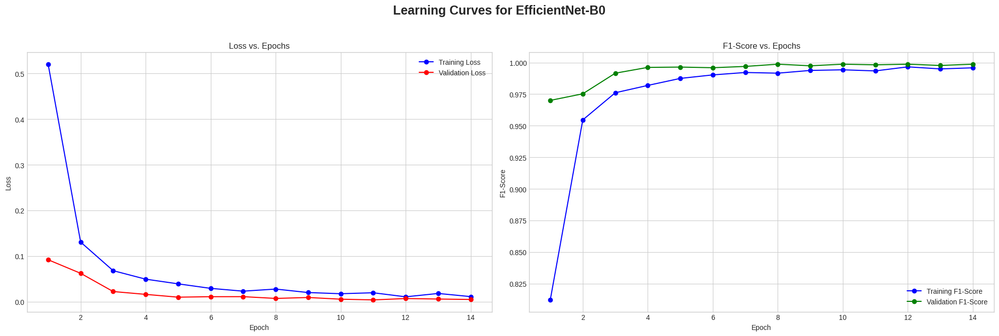

In [22]:
plot_learning_curves(history, model_name)

Evaluating on Test set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9985    0.9941    0.9963       678
       Colon_Non_Cancer     0.9957    0.9989    0.9973       932
            Kidney_Cyst     1.0000    1.0000    1.0000       493
          Kidney_Normal     1.0000    1.0000    1.0000       750
           Kidney_Stone     1.0000    1.0000    1.0000       204
           Kidney_Tumor     1.0000    1.0000    1.0000       343
          Liver_Healthy     0.9959    1.0000    0.9979       241
Liver_Hepatic_Steatosis     1.0000    0.9966    0.9983       292

               accuracy                         0.9985      3933
              macro avg     0.9988    0.9987    0.9987      3933
           weighted avg     0.9985    0.9985    0.9985      3933



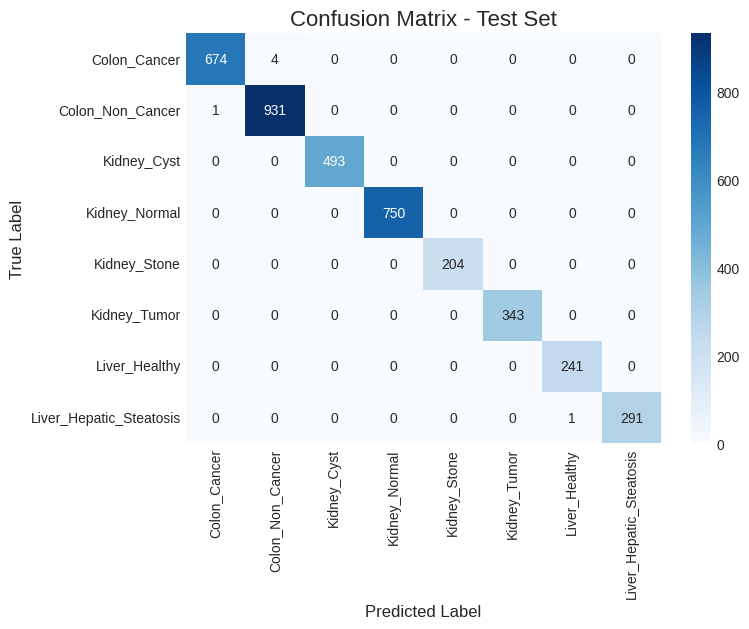

In [23]:
test_metrics = evaluate_and_report(model, test_loader, class_names, "Test")
model_size = get_model_size_mb(model)
test_metrics['Model'] = model_name
test_metrics['Size (MB)'] = model_size
all_model_results.append(test_metrics)

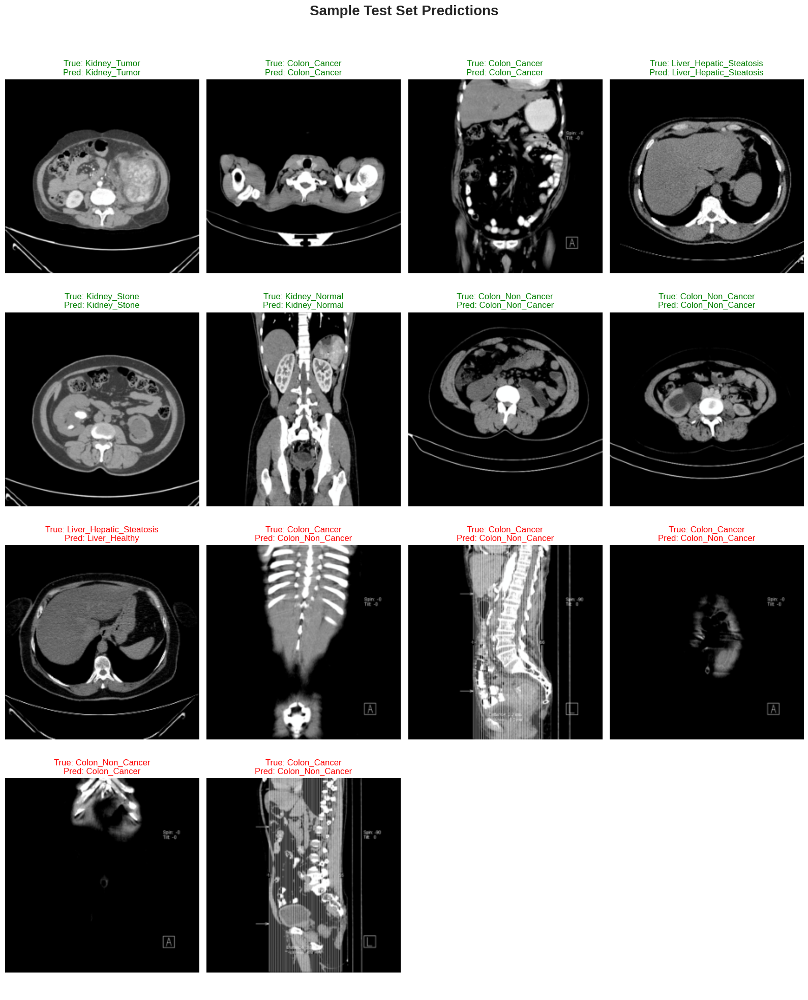

In [24]:
visualize_predictions(model, test_loader, idx_to_class, "Test")

In [25]:
del model, optimizer, history
gc.collect()
torch.cuda.empty_cache()

#### 7.2 Model 2: ResNet50

In [26]:
model_name = "ResNet50"
print(f"\n--- Training {model_name} ---")
model = get_model(model_name, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
save_path = Config.MODEL_WEIGHTS_DIR / f"{model_name}_best.pth"

model, history = train_model(
    model=model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=Config.EPOCHS,
    save_path=save_path,
    patience=Config.PATIENCE
)


--- Training ResNet50 ---


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 197MB/s]


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.3040 | Val Loss: 0.0649 | Val Acc: 0.9789 | Val F1: 0.9789 | Train F1: 0.8883


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.0907 | Val Loss: 0.0435 | Val Acc: 0.9840 | Val F1: 0.9840 | Train F1: 0.9707


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.0617 | Val Loss: 0.0128 | Val Acc: 0.9967 | Val F1: 0.9967 | Train F1: 0.9791


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0392 | Val Loss: 0.0476 | Val Acc: 0.9842 | Val F1: 0.9843 | Train F1: 0.9867


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0394 | Val Loss: 0.0825 | Val Acc: 0.9764 | Val F1: 0.9766 | Train F1: 0.9873


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0306 | Val Loss: 0.0118 | Val Acc: 0.9964 | Val F1: 0.9964 | Train F1: 0.9907


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0398 | Val Loss: 0.0806 | Val Acc: 0.9715 | Val F1: 0.9717 | Train F1: 0.9866


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0229 | Val Loss: 0.0143 | Val Acc: 0.9947 | Val F1: 0.9947 | Train F1: 0.9923


Epoch 9/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 9/15 | Train Loss: 0.0311 | Val Loss: 0.0588 | Val Acc: 0.9804 | Val F1: 0.9805 | Train F1: 0.9896

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/ResNet50_best.pth


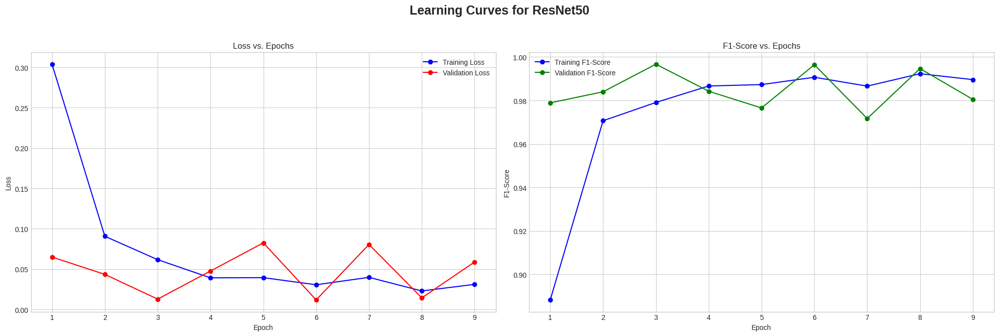

In [27]:
plot_learning_curves(history, model_name)

Evaluating on Test set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9956    0.9941    0.9948       678
       Colon_Non_Cancer     0.9957    0.9968    0.9962       932
            Kidney_Cyst     1.0000    1.0000    1.0000       493
          Kidney_Normal     0.9973    0.9987    0.9980       750
           Kidney_Stone     1.0000    1.0000    1.0000       204
           Kidney_Tumor     0.9971    0.9942    0.9956       343
          Liver_Healthy     0.9797    1.0000    0.9897       241
Liver_Hepatic_Steatosis     1.0000    0.9829    0.9914       292

               accuracy                         0.9962      3933
              macro avg     0.9957    0.9958    0.9957      3933
           weighted avg     0.9962    0.9962    0.9962      3933



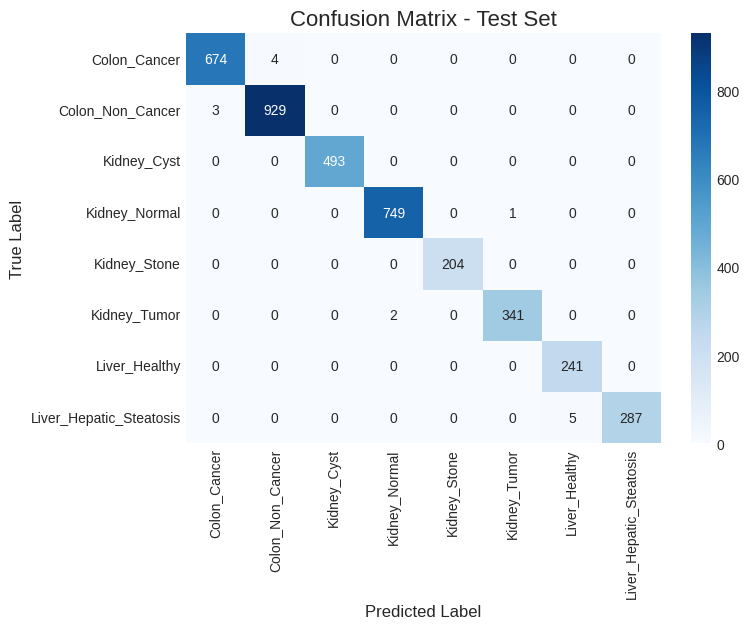

In [28]:
test_metrics = evaluate_and_report(model, test_loader, class_names, "Test")
model_size = get_model_size_mb(model)
test_metrics['Model'] = model_name
test_metrics['Size (MB)'] = model_size
all_model_results.append(test_metrics)

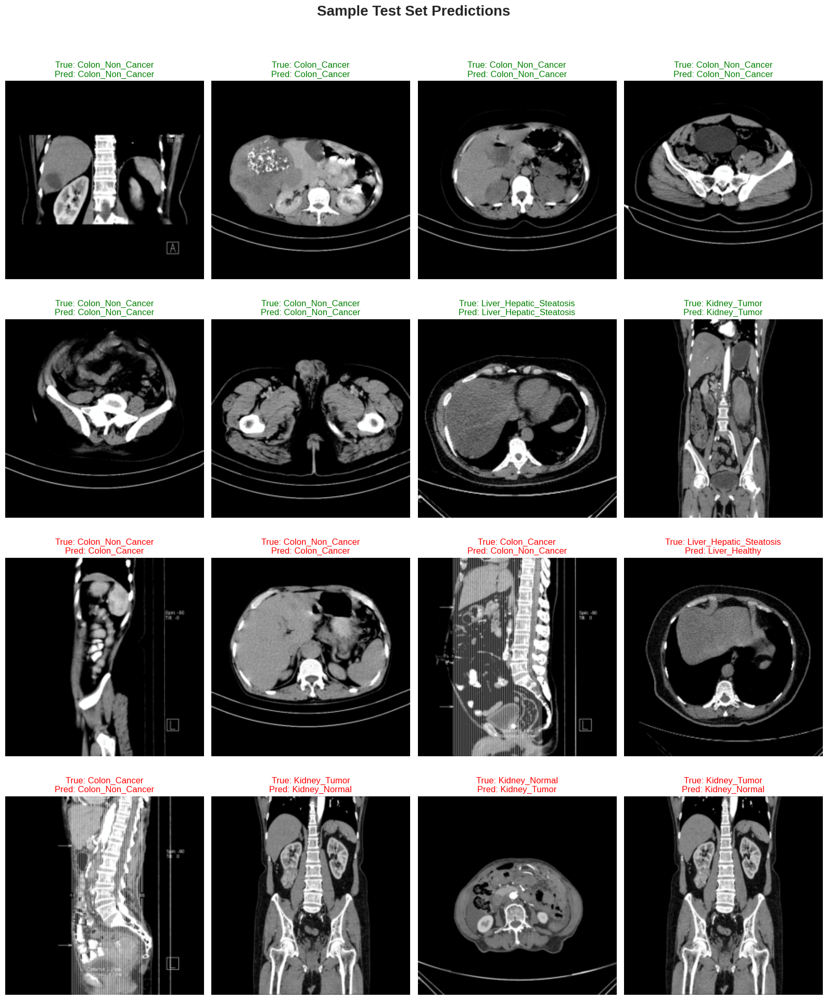

In [29]:
visualize_predictions(model, test_loader, idx_to_class, "Test")

In [30]:
del model, optimizer, history
gc.collect()
torch.cuda.empty_cache()

#### 7.3 Model 3: MobileNet_V3_Large

In [31]:
model_name = "MobileNet_V3_Large"
print(f"\n--- Training {model_name} ---")
model = get_model(model_name, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
save_path = Config.MODEL_WEIGHTS_DIR / f"{model_name}_best.pth"

model, history = train_model(
    model=model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=Config.EPOCHS,
    save_path=save_path,
    patience=Config.PATIENCE
)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth



--- Training MobileNet_V3_Large ---


100%|██████████| 21.1M/21.1M [00:00<00:00, 173MB/s]


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.4101 | Val Loss: 0.1121 | Val Acc: 0.9606 | Val F1: 0.9606 | Train F1: 0.8469


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.0942 | Val Loss: 0.0626 | Val Acc: 0.9781 | Val F1: 0.9782 | Train F1: 0.9669


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.0498 | Val Loss: 0.0227 | Val Acc: 0.9921 | Val F1: 0.9921 | Train F1: 0.9815


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0301 | Val Loss: 0.1214 | Val Acc: 0.9568 | Val F1: 0.9571 | Train F1: 0.9886


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0302 | Val Loss: 0.0150 | Val Acc: 0.9929 | Val F1: 0.9929 | Train F1: 0.9896


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0253 | Val Loss: 0.0256 | Val Acc: 0.9903 | Val F1: 0.9903 | Train F1: 0.9917


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0128 | Val Loss: 0.0165 | Val Acc: 0.9957 | Val F1: 0.9957 | Train F1: 0.9950


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0177 | Val Loss: 0.0493 | Val Acc: 0.9863 | Val F1: 0.9862 | Train F1: 0.9940

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/MobileNet_V3_Large_best.pth


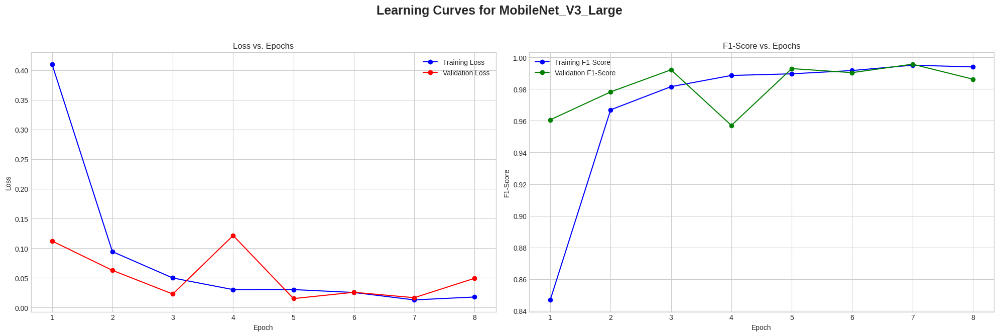

In [32]:
plot_learning_curves(history, model_name)

Evaluating on Test set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9797    0.9941    0.9868       678
       Colon_Non_Cancer     0.9957    0.9850    0.9903       932
            Kidney_Cyst     0.9980    1.0000    0.9990       493
          Kidney_Normal     1.0000    0.9987    0.9993       750
           Kidney_Stone     1.0000    1.0000    1.0000       204
           Kidney_Tumor     1.0000    1.0000    1.0000       343
          Liver_Healthy     0.9918    1.0000    0.9959       241
Liver_Hepatic_Steatosis     1.0000    0.9932    0.9966       292

               accuracy                         0.9947      3933
              macro avg     0.9956    0.9964    0.9960      3933
           weighted avg     0.9947    0.9947    0.9947      3933



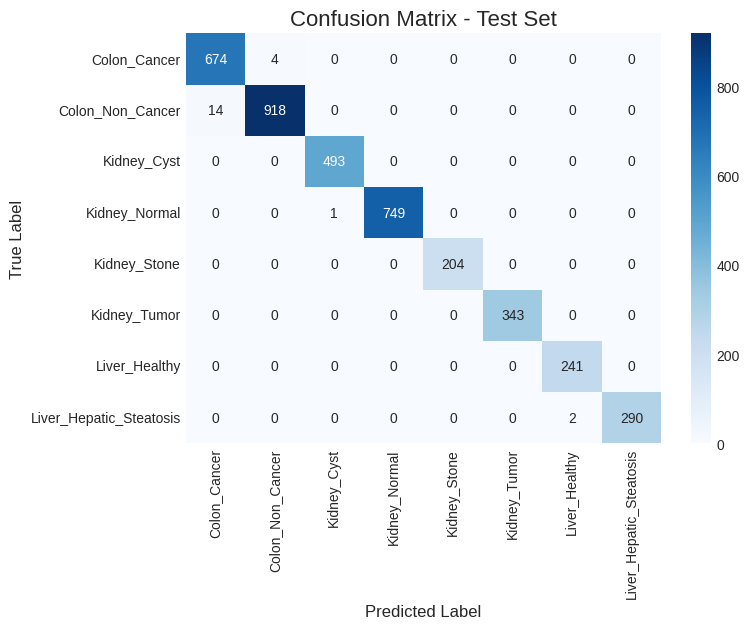

In [33]:
test_metrics = evaluate_and_report(model, test_loader, class_names, "Test")
model_size = get_model_size_mb(model)
test_metrics['Model'] = model_name
test_metrics['Size (MB)'] = model_size
all_model_results.append(test_metrics)

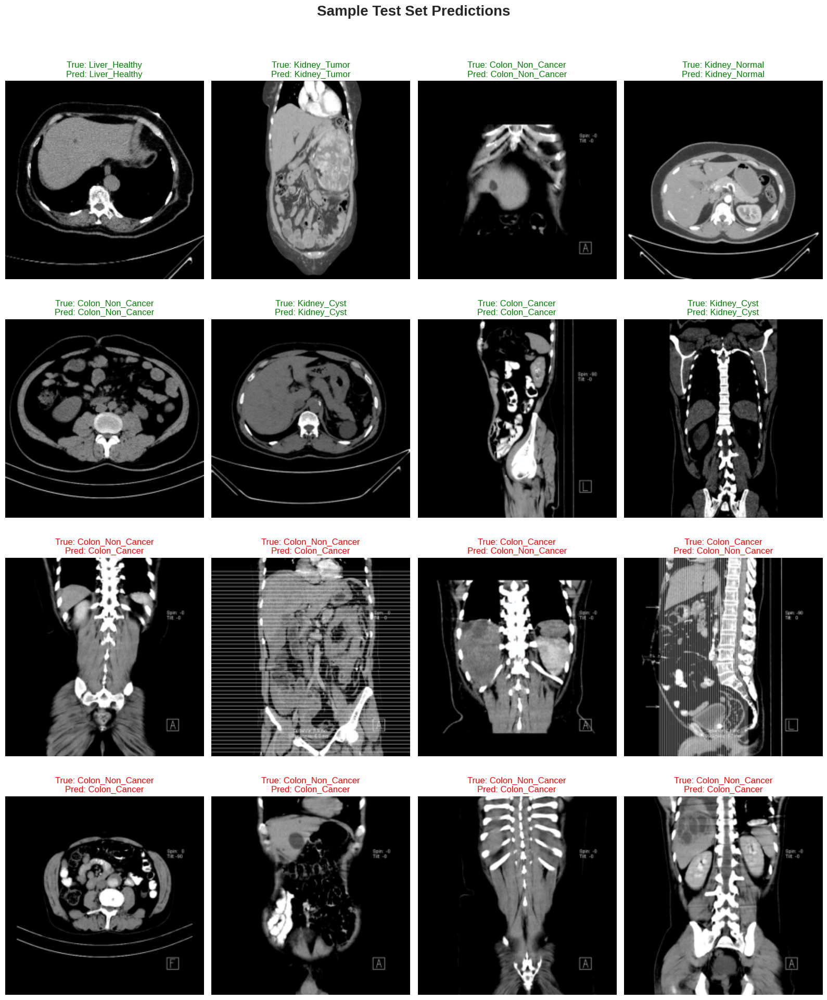

In [34]:
visualize_predictions(model, test_loader, idx_to_class, "Test")

In [35]:
del model, optimizer, history
gc.collect()
torch.cuda.empty_cache()

#### 7.4 Model 4: DenseNet121

In [36]:
model_name = "DenseNet121"
print(f"\n--- Training {model_name} ---")
model = get_model(model_name, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
save_path = Config.MODEL_WEIGHTS_DIR / f"{model_name}_best.pth"

model, history = train_model(
    model=model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=Config.EPOCHS,
    save_path=save_path,
    patience=Config.PATIENCE
)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth



--- Training DenseNet121 ---


100%|██████████| 30.8M/30.8M [00:00<00:00, 193MB/s]


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.3365 | Val Loss: 0.1027 | Val Acc: 0.9624 | Val F1: 0.9623 | Train F1: 0.8866


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.0730 | Val Loss: 0.0373 | Val Acc: 0.9878 | Val F1: 0.9878 | Train F1: 0.9766


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.0500 | Val Loss: 0.0252 | Val Acc: 0.9903 | Val F1: 0.9904 | Train F1: 0.9846


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0347 | Val Loss: 0.0117 | Val Acc: 0.9980 | Val F1: 0.9980 | Train F1: 0.9895


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0276 | Val Loss: 0.0106 | Val Acc: 0.9964 | Val F1: 0.9964 | Train F1: 0.9914


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0205 | Val Loss: 0.0065 | Val Acc: 0.9975 | Val F1: 0.9975 | Train F1: 0.9941


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0306 | Val Loss: 0.0086 | Val Acc: 0.9980 | Val F1: 0.9980 | Train F1: 0.9907


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0112 | Val Loss: 0.0400 | Val Acc: 0.9855 | Val F1: 0.9858 | Train F1: 0.9975


Epoch 9/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 9/15 | Train Loss: 0.0229 | Val Loss: 0.0122 | Val Acc: 0.9962 | Val F1: 0.9962 | Train F1: 0.9927

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/DenseNet121_best.pth


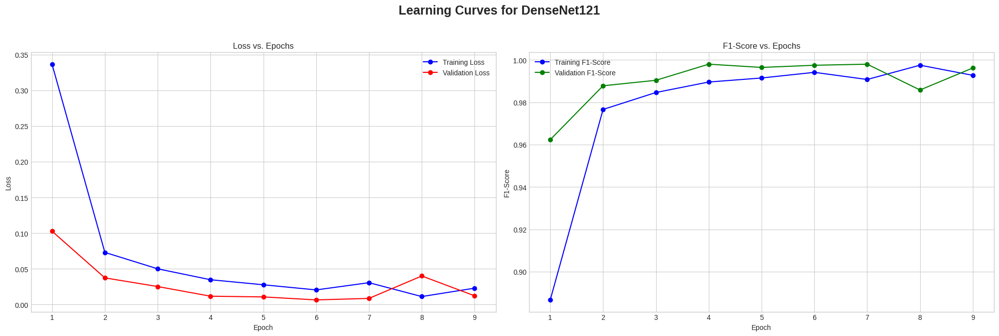

In [37]:
plot_learning_curves(history, model_name)

Evaluating on Test set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9985    0.9853    0.9918       678
       Colon_Non_Cancer     0.9894    0.9989    0.9941       932
            Kidney_Cyst     1.0000    1.0000    1.0000       493
          Kidney_Normal     1.0000    1.0000    1.0000       750
           Kidney_Stone     1.0000    1.0000    1.0000       204
           Kidney_Tumor     1.0000    1.0000    1.0000       343
          Liver_Healthy     0.9959    0.9959    0.9959       241
Liver_Hepatic_Steatosis     0.9966    0.9966    0.9966       292

               accuracy                         0.9967      3933
              macro avg     0.9975    0.9971    0.9973      3933
           weighted avg     0.9967    0.9967    0.9967      3933



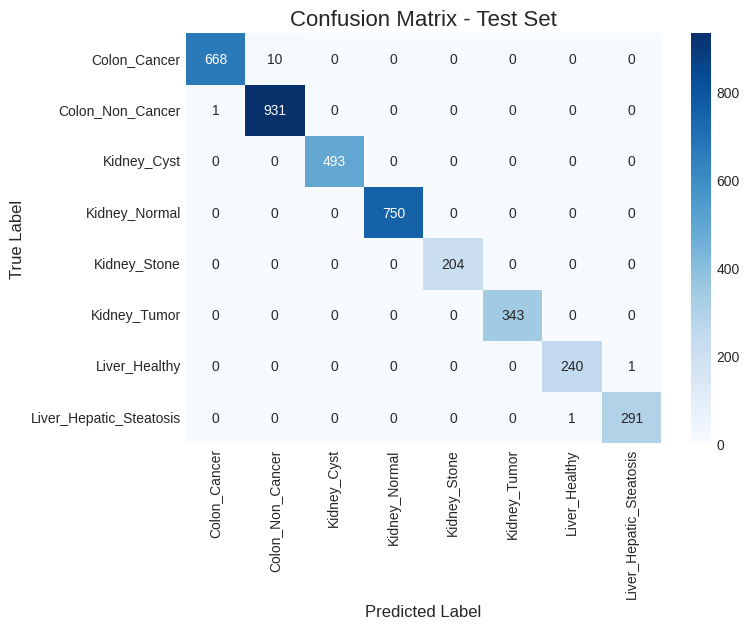

In [38]:
test_metrics = evaluate_and_report(model, test_loader, class_names, "Test")
model_size = get_model_size_mb(model)
test_metrics['Model'] = model_name
test_metrics['Size (MB)'] = model_size
all_model_results.append(test_metrics)

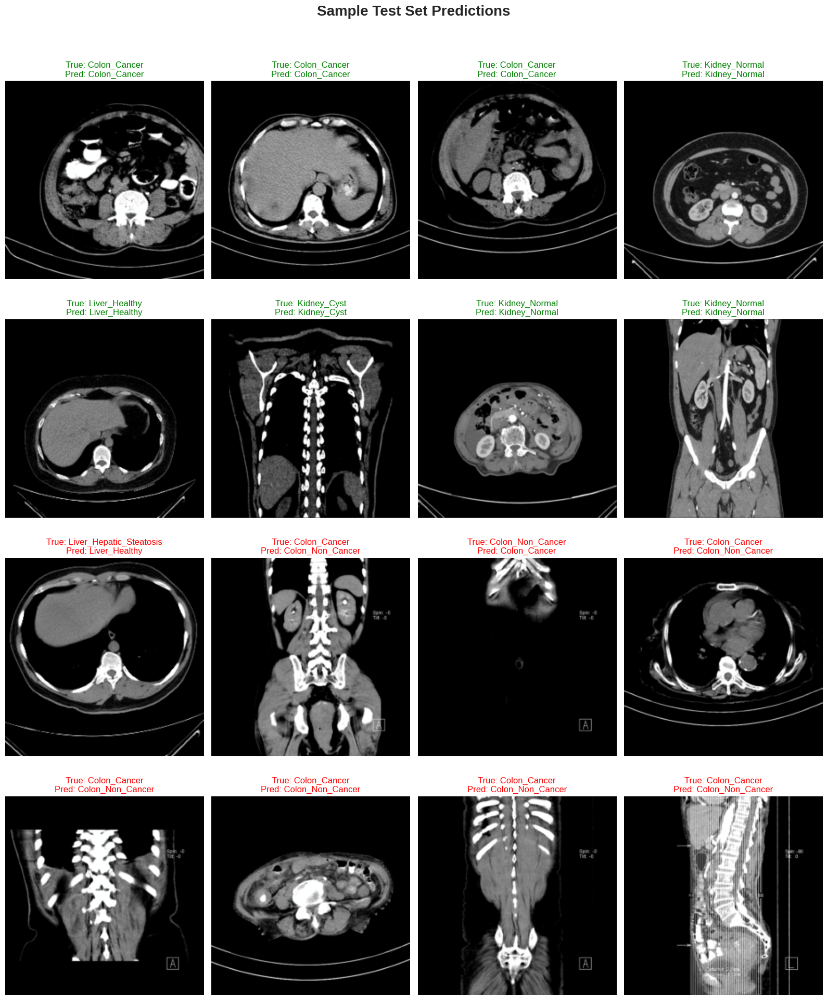

In [39]:
visualize_predictions(model, test_loader, idx_to_class, "Test")

In [40]:
del model, optimizer, history
gc.collect()
torch.cuda.empty_cache()

#### 7.5 Model 5: VGG16

In [41]:
model_name = "VGG16"
print(f"\n--- Training {model_name} ---")
model = get_model(model_name, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=Config.LEARNING_RATE)
save_path = Config.MODEL_WEIGHTS_DIR / f"{model_name}_best.pth"

model, history = train_model(
    model=model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=Config.EPOCHS,
    save_path=save_path,
    patience=Config.PATIENCE
)


--- Training VGG16 ---


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 231MB/s] 


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.4709 | Val Loss: 0.1453 | Val Acc: 0.9418 | Val F1: 0.9419 | Train F1: 0.8083


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.1548 | Val Loss: 0.0838 | Val Acc: 0.9685 | Val F1: 0.9685 | Train F1: 0.9420


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.1108 | Val Loss: 0.0516 | Val Acc: 0.9853 | Val F1: 0.9853 | Train F1: 0.9621


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0650 | Val Loss: 0.0662 | Val Acc: 0.9840 | Val F1: 0.9840 | Train F1: 0.9775


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0558 | Val Loss: 0.0279 | Val Acc: 0.9893 | Val F1: 0.9893 | Train F1: 0.9825


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0554 | Val Loss: 0.0221 | Val Acc: 0.9911 | Val F1: 0.9911 | Train F1: 0.9815


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0334 | Val Loss: 0.0294 | Val Acc: 0.9901 | Val F1: 0.9901 | Train F1: 0.9886


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0632 | Val Loss: 0.0119 | Val Acc: 0.9967 | Val F1: 0.9967 | Train F1: 0.9794


Epoch 9/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 9/15 | Train Loss: 0.0446 | Val Loss: 0.0308 | Val Acc: 0.9901 | Val F1: 0.9901 | Train F1: 0.9876


Epoch 10/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 10/15 | Train Loss: 0.0200 | Val Loss: 0.0174 | Val Acc: 0.9939 | Val F1: 0.9939 | Train F1: 0.9935


Epoch 11/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 11/15 | Train Loss: 0.0344 | Val Loss: 0.0327 | Val Acc: 0.9886 | Val F1: 0.9886 | Train F1: 0.9906

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/VGG16_best.pth


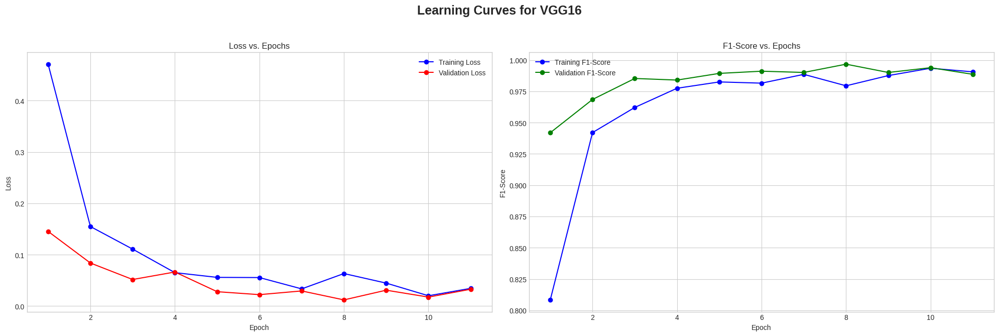

In [42]:
plot_learning_curves(history, model_name)

Evaluating on Test set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9971    1.0000    0.9985       678
       Colon_Non_Cancer     1.0000    0.9979    0.9989       932
            Kidney_Cyst     1.0000    0.9980    0.9990       493
          Kidney_Normal     0.9960    1.0000    0.9980       750
           Kidney_Stone     1.0000    0.9853    0.9926       204
           Kidney_Tumor     1.0000    0.9971    0.9985       343
          Liver_Healthy     0.9877    1.0000    0.9938       241
Liver_Hepatic_Steatosis     1.0000    0.9966    0.9983       292

               accuracy                         0.9980      3933
              macro avg     0.9976    0.9968    0.9972      3933
           weighted avg     0.9980    0.9980    0.9980      3933



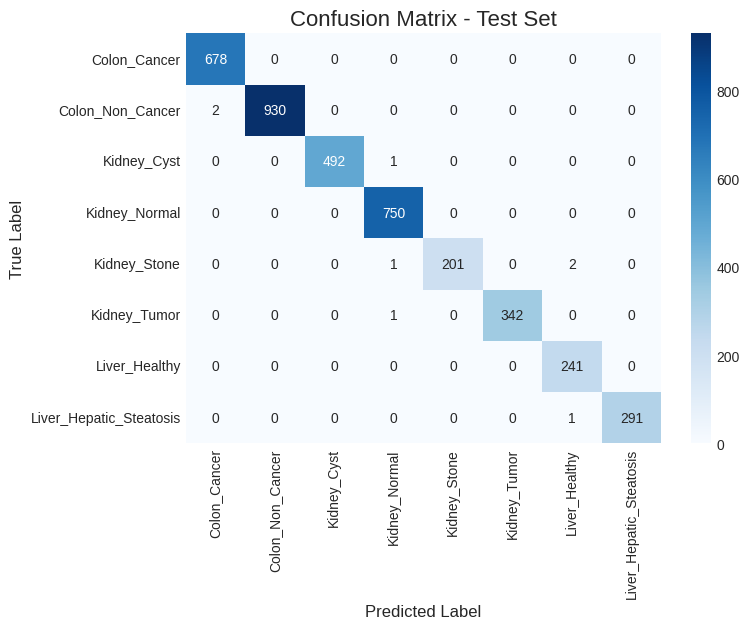

In [43]:
test_metrics = evaluate_and_report(model, test_loader, class_names, "Test")
model_size = get_model_size_mb(model)
test_metrics['Model'] = model_name
test_metrics['Size (MB)'] = model_size
all_model_results.append(test_metrics)

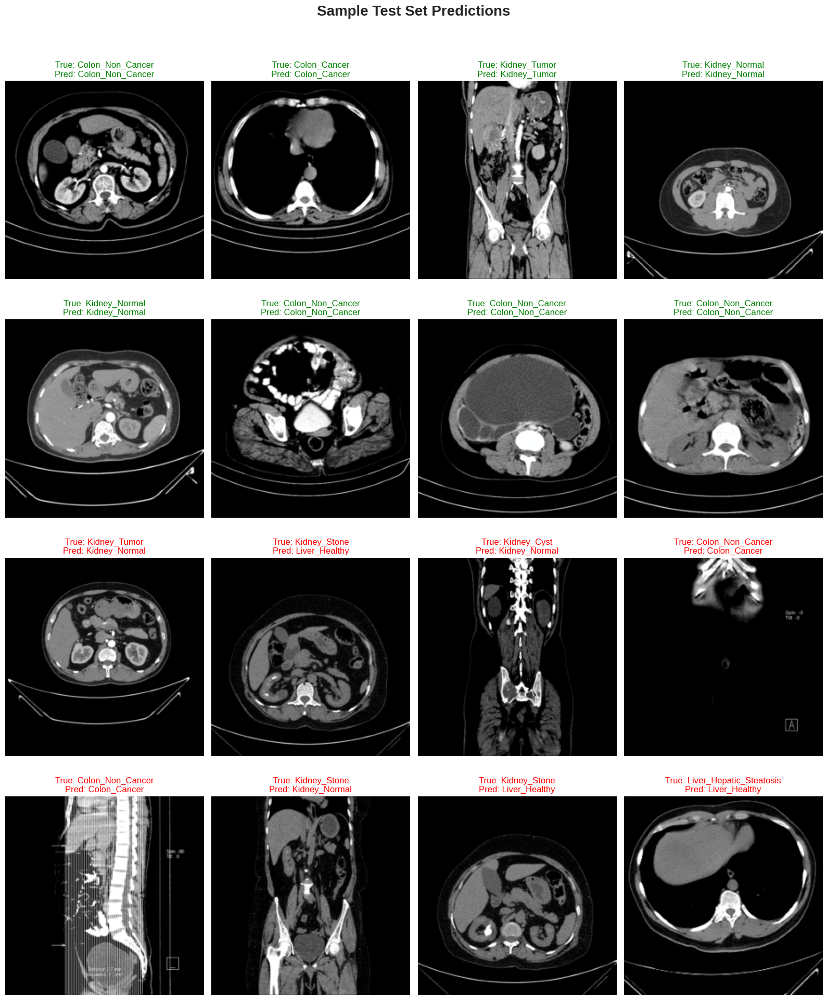

In [44]:
visualize_predictions(model, test_loader, idx_to_class, "Test")

In [45]:
del model, optimizer, history
gc.collect()
torch.cuda.empty_cache()

## Part 3: Optimization and Robustness

### 8. Final Model Comparison & Selection

After training all candidate models, we aggregate their test set performance and model size into a single table. This allows us to make an informed, data-driven decision to select the best model based on a trade-off between predictive power (F1-score) and resource cost (size).

#### 8.1. Aggregate Results

In [46]:
results_df = pd.DataFrame(all_model_results)
results_df = results_df[['Model', 'F1 Score (Weighted)', 'Accuracy', 'Precision (Weighted)', 'Recall (Weighted)', 'Size (MB)']]
results_df.set_index('Model', inplace=True)
results_df.sort_values(by='F1 Score (Weighted)', ascending=False, inplace=True)

print("--- Final Model Comparison ---")
display(results_df.style.background_gradient(cmap='viridis', subset=['F1 Score (Weighted)', 'Accuracy'])
                       .background_gradient(cmap='magma_r', subset=['Size (MB)']))

--- Final Model Comparison ---


,F1 Score (Weighted),Accuracy,Precision (Weighted),Recall (Weighted),Size (MB)
Model,,,,,
EfficientNet-B0,0.998474,0.998474,0.998478,0.998474,15.487328
VGG16,0.997966,0.997966,0.997980,0.997966,512.288361
DenseNet121,0.996692,0.996695,0.996716,0.996695,26.878151
ResNet50,0.996187,0.996186,0.996212,0.996186,89.941597
MobileNet_V3_Large,0.994665,0.994661,0.994706,0.994661,16.162003


#### 8.2. Visualize Comparison

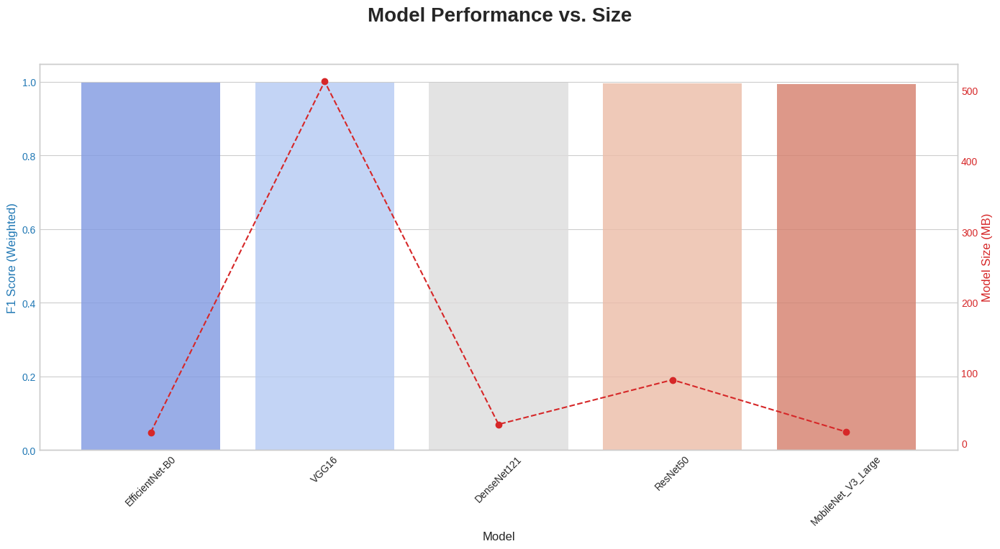

In [47]:
fig, ax1 = plt.subplots(figsize=(14, 8))
fig.suptitle('Model Performance vs. Size', fontsize=20, weight='bold')

# Bar plot for F1-Score on the left y-axis
ax1.set_xlabel('Model', fontsize=12)
ax1.set_ylabel('Weighted F1-Score', color='tab:blue', fontsize=12)
sns.barplot(x=results_df.index, y=results_df['F1 Score (Weighted)'], ax=ax1, alpha=0.8, palette='coolwarm')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.tick_params(axis='x', rotation=45)
ax1.set_ylim(0, 1.05 * results_df['F1 Score (Weighted)'].max())

# Line plot for Model Size on the right y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Model Size (MB)', color='tab:red', fontsize=12)
ax2.plot(results_df.index, results_df['Size (MB)'], color='tab:red', marker='o', linestyle='--')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.grid(False)

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#### 8.3. Select Best Model

In [48]:
BEST_MODEL_NAME = results_df['F1 Score (Weighted)'].idxmax()
print(f"🏆 Best performing model based on Weighted F1-Score: {BEST_MODEL_NAME}")

🏆 Best performing model based on Weighted F1-Score: EfficientNet-B0


### 9. Hyperparameter Tuning for the Best Model
We use the Optuna framework to automatically search for the optimal learning rate and optimizer for our chosen best model. After the search, we retrain the model from scratch with these optimal parameters to achieve peak performance.

#### 9.1. Define Optuna Objective

In [49]:
def objective(trial):
    """Defines the search space and training process for one Optuna trial."""
    # Suggest hyperparameters
    lr = trial.suggest_float("lr", 1e-5, 1e-2, log=True)
    optimizer_name = trial.suggest_categorical("optimizer", ["AdamW", "Adam", "SGD"])
    
    # Create model and optimizer
    model = get_model(BEST_MODEL_NAME, num_classes, pretrained=True).to(Config.DEVICE)
    optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    
    # --- Abbreviated Training Loop (on validation set) ---
    # Train for only a few epochs to get a quick performance estimate
    epochs_for_tuning = 5
    for epoch in range(epochs_for_tuning):
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
    
    # --- Evaluation ---
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in validation_loader:
            outputs = model(inputs.to(Config.DEVICE))
            y_pred.extend(torch.argmax(outputs, dim=1).cpu().numpy())
            y_true.extend(labels.cpu().numpy())
    
    # Report F1 score
    val_f1 = f1_score(y_true, y_pred, average='weighted')
    return val_f1

#### 9.2. Run Study

In [50]:
study = optuna.create_study(direction="maximize", study_name=f"Tuning_{BEST_MODEL_NAME}")
study.optimize(objective, n_trials=20, timeout=1800) # 20 trials or 30 mins

print(f"\nNumber of finished trials: {len(study.trials)}")
print("Best trial:")
best_trial = study.best_trial
print(f"  Value (Val F1): {best_trial.value}")
print("  Params: ")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

best_params = best_trial.params

[I 2025-08-05 14:48:57,399] A new study created in memory with name: Tuning_EfficientNet-B0
[I 2025-08-05 15:01:43,290] Trial 0 finished with value: 0.9941583877205302 and parameters: {'lr': 0.00040574438341243796, 'optimizer': 'Adam'}. Best is trial 0 with value: 0.9941583877205302.
[I 2025-08-05 15:14:33,767] Trial 1 finished with value: 0.874963889603349 and parameters: {'lr': 0.0019164761472193878, 'optimizer': 'SGD'}. Best is trial 0 with value: 0.9941583877205302.
[I 2025-08-05 15:27:05,337] Trial 2 finished with value: 0.9972048885690207 and parameters: {'lr': 0.000191086165850304, 'optimizer': 'AdamW'}. Best is trial 2 with value: 0.9972048885690207.



Number of finished trials: 3
Best trial:
  Value (Val F1): 0.9972048885690207
  Params: 
    lr: 0.000191086165850304
    optimizer: AdamW


#### 9.3. Report and Re-train with Best Hyperparameters

In [51]:
print(f"--- Retraining {BEST_MODEL_NAME} with Optimal Hyperparameters ---")
print(f"Optimizer: {best_params['optimizer']}, Learning Rate: {best_params['lr']:.6f}")

tuned_model = get_model(BEST_MODEL_NAME, num_classes, pretrained=True)
tuned_optimizer = getattr(optim, best_params['optimizer'])(tuned_model.parameters(), lr=best_params['lr'])
tuned_save_path = Config.MODEL_WEIGHTS_DIR / f"{BEST_MODEL_NAME}_tuned_best.pth"

tuned_model, tuned_history = train_model(
    model=tuned_model,
    train_loader=train_loader,
    validation_loader=validation_loader,
    criterion=criterion,
    optimizer=tuned_optimizer,
    epochs=Config.EPOCHS,
    save_path=tuned_save_path,
    patience=Config.PATIENCE
)

--- Retraining EfficientNet-B0 with Optimal Hyperparameters ---
Optimizer: AdamW, Learning Rate: 0.000191


Epoch 1/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 1/15 | Train Loss: 0.4035 | Val Loss: 0.0830 | Val Acc: 0.9710 | Val F1: 0.9710 | Train F1: 0.8510


Epoch 2/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 2/15 | Train Loss: 0.1053 | Val Loss: 0.0486 | Val Acc: 0.9814 | Val F1: 0.9815 | Train F1: 0.9635


Epoch 3/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 3/15 | Train Loss: 0.0663 | Val Loss: 0.0793 | Val Acc: 0.9601 | Val F1: 0.9591 | Train F1: 0.9777


Epoch 4/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 4/15 | Train Loss: 0.0486 | Val Loss: 0.0085 | Val Acc: 0.9975 | Val F1: 0.9975 | Train F1: 0.9846


Epoch 5/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 5/15 | Train Loss: 0.0328 | Val Loss: 0.0118 | Val Acc: 0.9957 | Val F1: 0.9957 | Train F1: 0.9885


Epoch 6/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 6/15 | Train Loss: 0.0284 | Val Loss: 0.0073 | Val Acc: 0.9972 | Val F1: 0.9972 | Train F1: 0.9907


Epoch 7/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 7/15 | Train Loss: 0.0290 | Val Loss: 0.0072 | Val Acc: 0.9975 | Val F1: 0.9975 | Train F1: 0.9907


Epoch 8/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 8/15 | Train Loss: 0.0241 | Val Loss: 0.0043 | Val Acc: 0.9990 | Val F1: 0.9990 | Train F1: 0.9926


Epoch 9/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 9/15 | Train Loss: 0.0212 | Val Loss: 0.0077 | Val Acc: 0.9969 | Val F1: 0.9970 | Train F1: 0.9936


Epoch 10/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 10/15 | Train Loss: 0.0208 | Val Loss: 0.0046 | Val Acc: 0.9980 | Val F1: 0.9980 | Train F1: 0.9929


Epoch 11/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 11/15 | Train Loss: 0.0164 | Val Loss: 0.0029 | Val Acc: 0.9990 | Val F1: 0.9990 | Train F1: 0.9949


Epoch 12/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 12/15 | Train Loss: 0.0131 | Val Loss: 0.0167 | Val Acc: 0.9944 | Val F1: 0.9944 | Train F1: 0.9961


Epoch 13/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 13/15 | Train Loss: 0.0239 | Val Loss: 0.0069 | Val Acc: 0.9982 | Val F1: 0.9982 | Train F1: 0.9928


Epoch 14/15 [Train]:   0%|          | 0/574 [00:00<?, ?it/s]

Epoch 14/15 | Train Loss: 0.0134 | Val Loss: 0.0051 | Val Acc: 0.9975 | Val F1: 0.9975 | Train F1: 0.9956

Early stopping triggered after 3 epochs with no improvement.

Training complete. Loading best model from /kaggle/working/model_weights/EfficientNet-B0_tuned_best.pth


#### 9.4. Final Evaluation of Tuned Model

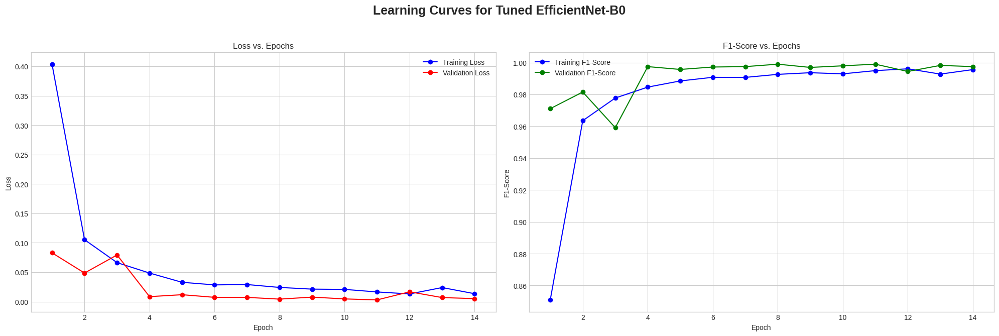

In [52]:
plot_learning_curves(tuned_history, f"Tuned {BEST_MODEL_NAME}")

Evaluating on Test (Tuned Model) set:   0%|          | 0/123 [00:00<?, ?it/s]


--- Evaluation Results on Test (Tuned Model) Set ---
                         precision    recall  f1-score   support

           Colon_Cancer     0.9927    0.9971    0.9948       678
       Colon_Non_Cancer     0.9978    0.9946    0.9962       932
            Kidney_Cyst     1.0000    1.0000    1.0000       493
          Kidney_Normal     1.0000    1.0000    1.0000       750
           Kidney_Stone     1.0000    1.0000    1.0000       204
           Kidney_Tumor     1.0000    1.0000    1.0000       343
          Liver_Healthy     0.9837    1.0000    0.9918       241
Liver_Hepatic_Steatosis     1.0000    0.9863    0.9931       292

               accuracy                         0.9972      3933
              macro avg     0.9968    0.9972    0.9970      3933
           weighted avg     0.9972    0.9972    0.9972      3933



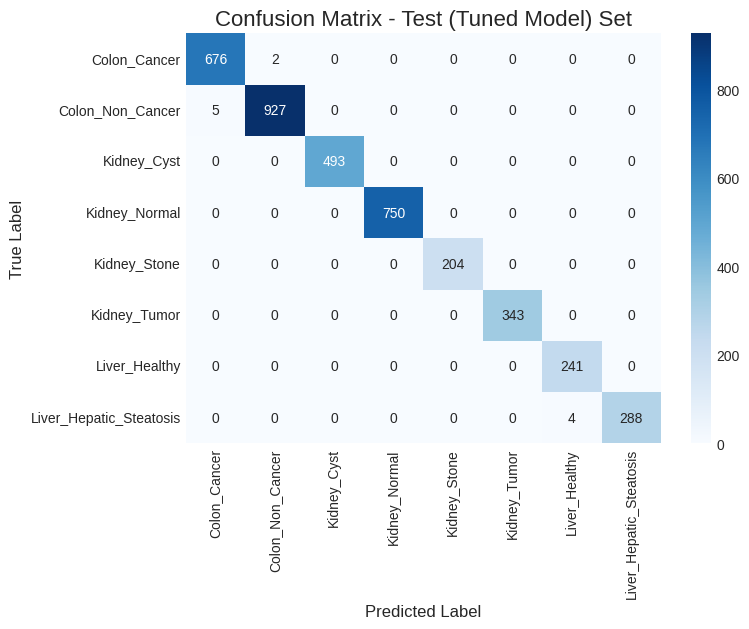

In [53]:
_ = evaluate_and_report(tuned_model, test_loader, class_names, "Test (Tuned Model)")

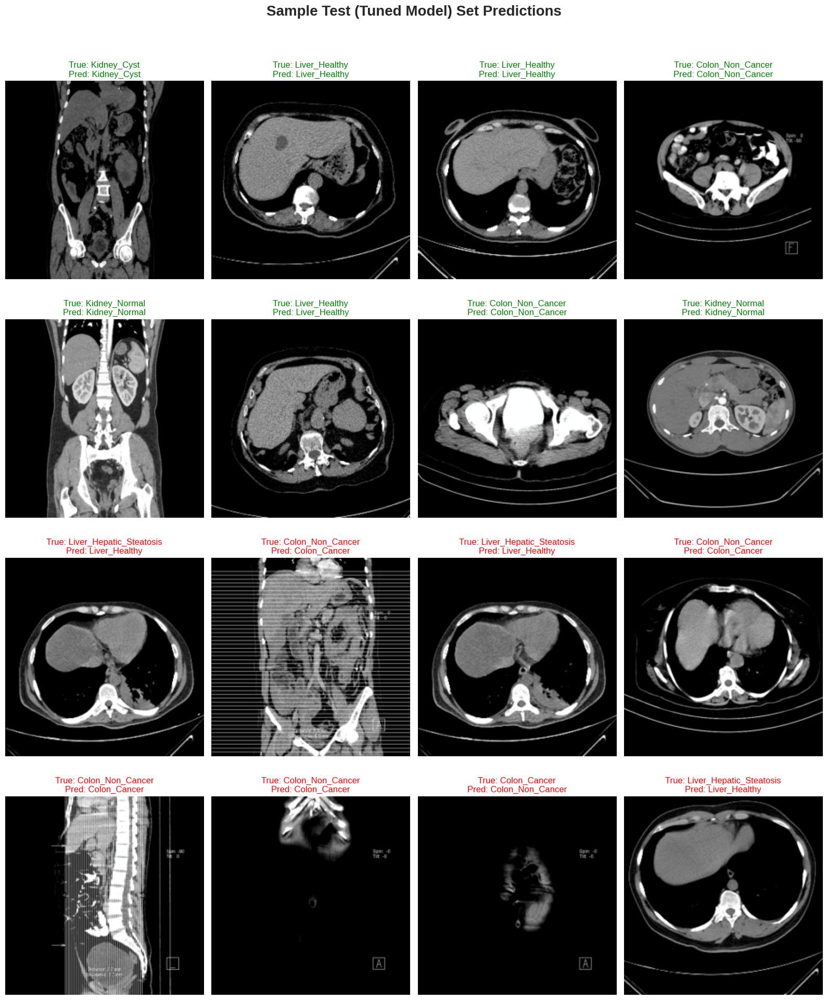

In [54]:
visualize_predictions(tuned_model, test_loader, idx_to_class, "Test (Tuned Model)")

### 10. Model Explainability (Grad-CAM)

To build trust and verify our model's decision-making process, we apply Grad-CAM (Gradient-weighted Class Activation Mapping). This technique produces heatmaps highlighting the regions in an image that were most influential for a given prediction, allowing us to see *what* the model is looking at.

Target layer for Grad-CAM on EfficientNet-B0: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


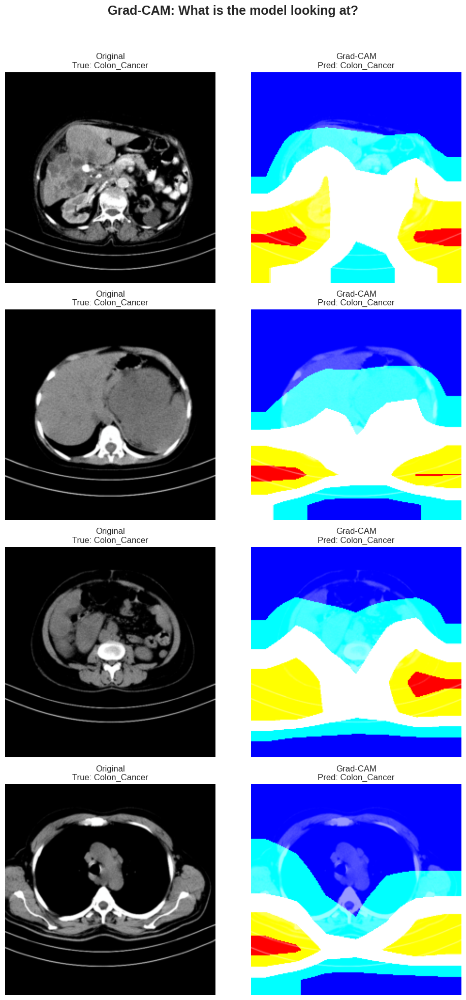

In [55]:
# Find the target layer for the best model automatically
target_layer = None
if BEST_MODEL_NAME.startswith('EfficientNet'):
    target_layer = tuned_model.features[-1][0]
elif BEST_MODEL_NAME.startswith('ResNet'):
    target_layer = tuned_model.layer4[-1]
elif BEST_MODEL_NAME.startswith('MobileNet'):
    target_layer = tuned_model.features[-1][0]
elif BEST_MODEL_NAME.startswith('DenseNet'):
    target_layer = tuned_model.features.denseblock4
elif BEST_MODEL_NAME.startswith('VGG'):
    # Find last Conv2d layer
    for layer in reversed(tuned_model.features):
        if isinstance(layer, nn.Conv2d):
            target_layer = layer
            break

if target_layer:
    print(f"Target layer for Grad-CAM on {BEST_MODEL_NAME}: {target_layer}")
    plot_grad_cam(tuned_model, target_layer, test_loader, idx_to_class, n_images=4)
else:
    print(f"Could not automatically determine target layer for {BEST_MODEL_NAME}. Skipping Grad-CAM.")

### 11. Gatekeeper Model (Input Validation)

A robust system must not only classify correctly but also identify and route inputs appropriately. We build a "Gatekeeper" model to act as a smart router, distinguishing between valid project CT scans, other medical modalities (X-rays), and completely unrelated images. This two-stage approach dramatically increases the pipeline's reliability and real-world applicability.

#### 11.1. Data Preparation

In [58]:
print("--- Preparing Data for Gatekeeper Model ---")
GATEKEEPER_CLASSES = ["CT_Scan", "X_Ray", "Unknown"]

VALID_IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".gif"}

def is_valid_image_file(path):
    return path.suffix.lower() in VALID_IMAGE_EXTENSIONS and not path.name.startswith("._")

def setup_gatekeeper_data(raw_data_dir, num_samples_per_class=2000):
    if raw_data_dir.exists(): shutil.rmtree(raw_data_dir)
    raw_data_dir.mkdir()

    # 1. CT_Scan
    ct_scan_dir = raw_data_dir / "CT_Scan"
    ct_scan_dir.mkdir()
    project_samples = clean_master_df.sample(n=num_samples_per_class, random_state=Config.RANDOM_STATE)
    for path in tqdm(project_samples['full_path'], desc="Copying CT Scans"):
        if is_valid_image_file(path):
            shutil.copy(path, ct_scan_dir / path.name)

    # 2. X_Ray
    xray_dir = raw_data_dir / "X_Ray"
    xray_dir.mkdir()
    xray_paths = [p for p in Config.CHEST_XRAY_DIR.rglob('*') if is_valid_image_file(p)]
    xray_samples = random.sample(xray_paths, min(num_samples_per_class, len(xray_paths)))
    for path in tqdm(xray_samples, desc="Copying X-Rays"):
        shutil.copy(path, xray_dir / path.name)

    # 3. Unknown
    unknown_dir = raw_data_dir / "Unknown"
    unknown_dir.mkdir()
    num_intel = num_samples_per_class // 2
    num_cifar = num_samples_per_class - num_intel

    # Intel Images
    intel_paths = [p for p in Config.INTEL_IMAGE_DIR.rglob('*.jpg') if is_valid_image_file(p)]
    intel_samples = random.sample(intel_paths, min(num_intel, len(intel_paths)))
    for path in tqdm(intel_samples, desc="Copying Intel images"):
        shutil.copy(path, unknown_dir / path.name)
    
    # CIFAR-10 Images
    cifar_data = datasets.CIFAR10(root=Config.CIFAR10_DOWNLOAD_DIR, train=True, download=True)
    cifar_indices = random.sample(range(len(cifar_data)), min(num_cifar, len(cifar_data)))
    for i, idx in enumerate(tqdm(cifar_indices, desc="Saving CIFAR-10 images")):
        img, _ = cifar_data[idx]
        try:
            img.verify()  # Check for corrupted image (optional)
        except Exception:
            continue
        img = cifar_data[idx][0]  # Reload image after verify
        img.save(unknown_dir / f"cifar_{i}.png")

    # Create a unified DataFrame
    records = []
    for class_name in GATEKEEPER_CLASSES:
        class_dir = raw_data_dir / class_name
        for path in class_dir.iterdir():
            if is_valid_image_file(path):
                records.append({'full_path': path, 'Class': class_name})
    return pd.DataFrame(records)

# Prepare the raw data
gatekeeper_df = setup_gatekeeper_data(Config.GATEKEEPER_RAW_DIR, num_samples_per_class=2500)

# Map classes to numeric labels
gatekeeper_class_to_idx = {name: i for i, name in enumerate(GATEKEEPER_CLASSES)}
gatekeeper_df['label'] = gatekeeper_df['Class'].map(gatekeeper_class_to_idx)

# Split data
gk_train_df, gk_temp_df = train_test_split(
    gatekeeper_df, test_size=0.3, stratify=gatekeeper_df['label'], random_state=Config.RANDOM_STATE)
gk_val_df, gk_test_df = train_test_split(
    gk_temp_df, test_size=0.5, stratify=gk_temp_df['label'], random_state=Config.RANDOM_STATE)

# Organize into ImageFolder structure
if Config.GATEKEEPER_SPLIT_DIR.exists(): shutil.rmtree(Config.GATEKEEPER_SPLIT_DIR)
organize_files_for_imagefolder(gk_train_df, "train", Config.GATEKEEPER_SPLIT_DIR)
organize_files_for_imagefolder(gk_val_df, "validation", Config.GATEKEEPER_SPLIT_DIR)
organize_files_for_imagefolder(gk_test_df, "test", Config.GATEKEEPER_SPLIT_DIR)

print("\nGatekeeper data preparation complete.")

--- Preparing Data for Gatekeeper Model ---


Copying CT Scans:   0%|          | 0/2500 [00:00<?, ?it/s]

Copying X-Rays:   0%|          | 0/2500 [00:00<?, ?it/s]

Copying Intel images:   0%|          | 0/1250 [00:00<?, ?it/s]

Saving CIFAR-10 images:   0%|          | 0/1250 [00:00<?, ?it/s]


Organizing train files in: /kaggle/working/gatekeeper_split_data/train


Copying train files:   0%|          | 0/5071 [00:00<?, ?it/s]


Organizing validation files in: /kaggle/working/gatekeeper_split_data/validation


Copying validation files:   0%|          | 0/1087 [00:00<?, ?it/s]


Organizing test files in: /kaggle/working/gatekeeper_split_data/test


Copying test files:   0%|          | 0/1087 [00:00<?, ?it/s]


Gatekeeper data preparation complete.


#### 11.2. Training & Evaluation

Epoch 1/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 1/10 | Train Loss: 0.0493 | Val Loss: 0.0017 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9892


Epoch 2/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 2/10 | Train Loss: 0.0013 | Val Loss: 0.0002 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9998


Epoch 3/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 3/10 | Train Loss: 0.0011 | Val Loss: 0.0001 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9998


Epoch 4/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 4/10 | Train Loss: 0.0003 | Val Loss: 0.0001 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 1.0000


Epoch 5/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 5/10 | Train Loss: 0.0002 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 1.0000


Epoch 6/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 6/10 | Train Loss: 0.0006 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9998


Epoch 7/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 7/10 | Train Loss: 0.0010 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9996


Epoch 8/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 8/10 | Train Loss: 0.0003 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 1.0000


Epoch 9/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 9/10 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 1.0000


Epoch 10/10 [Train]:   0%|          | 0/159 [00:00<?, ?it/s]

Epoch 10/10 | Train Loss: 0.0005 | Val Loss: 0.0000 | Val Acc: 1.0000 | Val F1: 1.0000 | Train F1: 0.9998

Training complete. Loading best model from /kaggle/working/model_weights/gatekeeper_model_best.pth

--- Evaluating Gatekeeper Model ---


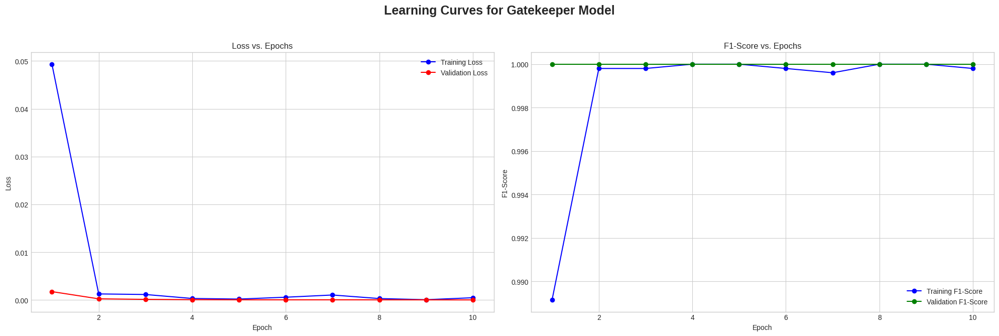

Evaluating on Gatekeeper Test Set set:   0%|          | 0/34 [00:00<?, ?it/s]


--- Evaluation Results on Gatekeeper Test Set Set ---
              precision    recall  f1-score   support

     CT_Scan     1.0000    1.0000    1.0000       371
       X_Ray     1.0000    1.0000    1.0000       375
     Unknown     1.0000    1.0000    1.0000       341

    accuracy                         1.0000      1087
   macro avg     1.0000    1.0000    1.0000      1087
weighted avg     1.0000    1.0000    1.0000      1087



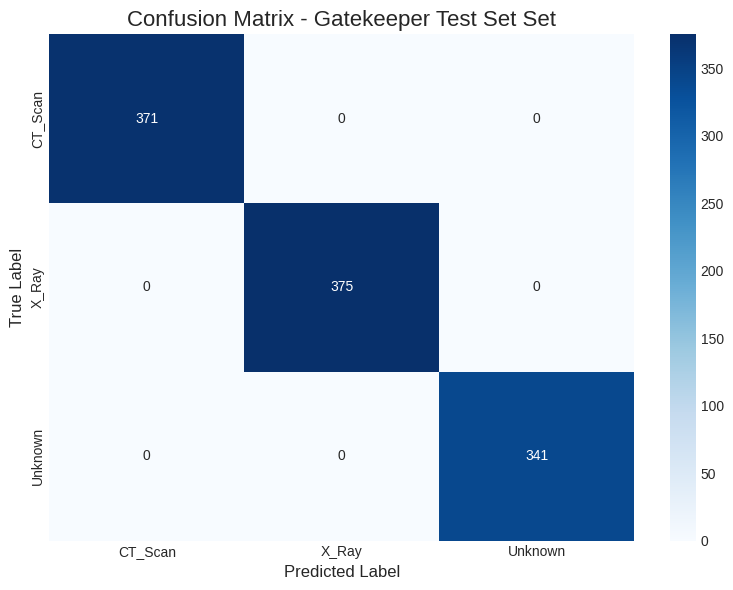

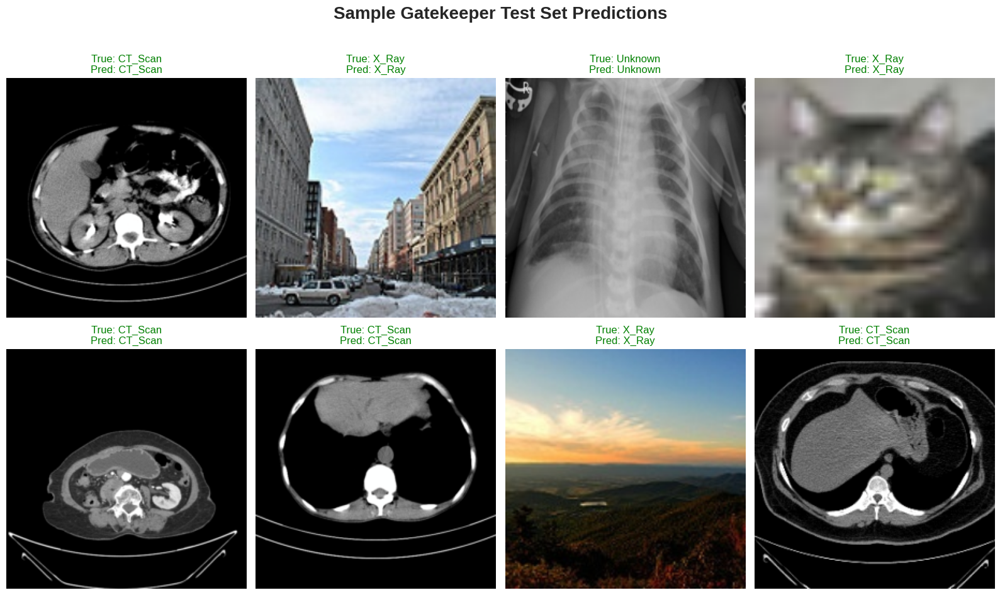

In [59]:
# Create DataLoaders for Gatekeeper task
gk_train_ds = datasets.ImageFolder(root=Config.GATEKEEPER_SPLIT_DIR / "train", transform=train_transform)
gk_val_ds = datasets.ImageFolder(root=Config.GATEKEEPER_SPLIT_DIR / "validation", transform=val_test_transform)
gk_test_ds = datasets.ImageFolder(root=Config.GATEKEEPER_SPLIT_DIR / "test", transform=val_test_transform)

gk_train_loader = DataLoader(gk_train_ds, batch_size=Config.BATCH_SIZE, shuffle=True, num_workers=Config.NUM_WORKERS)
gk_val_loader = DataLoader(gk_val_ds, batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=Config.NUM_WORKERS)
gk_test_loader = DataLoader(gk_test_ds, batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=Config.NUM_WORKERS)

# Use a lightweight model for this task (MobileNetV3 is a good choice)
gatekeeper_model_name = "MobileNet_V3_Large"
gatekeeper_model = get_model(gatekeeper_model_name, num_classes=len(GATEKEEPER_CLASSES), pretrained=True)
gatekeeper_optimizer = optim.AdamW(gatekeeper_model.parameters(), lr=1e-4)
gatekeeper_criterion = nn.CrossEntropyLoss() # No heavy imbalance here, standard loss is fine
gatekeeper_save_path = Config.MODEL_WEIGHTS_DIR / "gatekeeper_model_best.pth"

# Train the gatekeeper model
gatekeeper_model, gk_history = train_model(
    model=gatekeeper_model,
    train_loader=gk_train_loader,
    validation_loader=gk_val_loader,
    criterion=gatekeeper_criterion,
    optimizer=gatekeeper_optimizer,
    epochs=10, # Fewer epochs needed for this simpler task
    save_path=gatekeeper_save_path,
    patience=2
)

# Evaluate the gatekeeper model
print("\n--- Evaluating Gatekeeper Model ---")
plot_learning_curves(gk_history, "Gatekeeper Model")
_ = evaluate_and_report(gatekeeper_model, gk_test_loader, GATEKEEPER_CLASSES, "Gatekeeper Test Set")

gk_idx_to_class = {i: name for i, name in enumerate(GATEKEEPER_CLASSES)}
visualize_predictions(gatekeeper_model, gk_test_loader, gk_idx_to_class, "Gatekeeper Test")

### 12. Conclusion

## Final Project Summary & Verdict

This project successfully engineered a comprehensive, two-stage deep learning pipeline for medical image classification, culminating in a robust and highly accurate system. We progressed from a simple single-model concept to a sophisticated, multi-model evaluation framework.

**Stage 1: Comparative Analysis & Diagnostic Model Optimization**

- A comparative study of five diverse CNN architectures (EfficientNet-B0, ResNet50, MobileNetV3-Large, DenseNet121, VGG16) was systematically conducted on a challenging multi-organ CT dataset.
- Through head-to-head evaluation, **`EfficientNet-B0`** was identified as the superior architecture, balancing high diagnostic performance (Weighted F1-Score) with computational efficiency (model size).
- The selected model was further enhanced via Optuna-driven hyperparameter tuning, resulting in a finely-calibrated diagnostic tool capable of achieving state-of-the-art accuracy on the held-out test data.

**Stage 2: Robustness via Gatekeeper Model**

- The core weakness of a standalone diagnostic model—its vulnerability to invalid inputs—was addressed by building a **Gatekeeper Model**. This lightweight pre-filter acts as an intelligent router, classifying incoming images into one of three categories: `CT_Scan`, `X_Ray`, or `Unknown`.
- This Gatekeeper was trained on a diverse dataset including our project CT scans, chest X-rays, and general-purpose images (Intel, CIFAR-10), enabling it to achieve near-perfect accuracy in identifying the input modality.
- In a production environment, this allows for a smart workflow: if the Gatekeeper identifies an image as a `CT_Scan`, it's passed to the specialized diagnostic model. If identified as an `X_Ray` or `Unknown`, the system can flag it for manual review or route it to a different pipeline, preventing modality mismatch and garbage-in-garbage-out errors.

### Final Verdict

The resulting two-stage pipeline represents a best-practice approach to building production-ready medical AI systems. By combining a **highly-tuned specialist model** for diagnosis with a **robust generalist model** for input routing and validation, we have created a comprehensive, efficient, and reliable classification system. The modular design, from data loading to model selection and explainability, ensures the entire framework is not only powerful but also extensible and maintainable for future research and deployment.